In [1]:
import os
from pprint import pprint

import numpy as np
import pandas as pd

In [93]:
# np : 1.25.2 
# sklearn :1.2.1(pycaret)
# pandas : 2.1.0 > miceforest / 1.3.0(pycaret)

ROOT_DIR = "data"
train_data = pd.read_csv(os.path.join(ROOT_DIR, "train.csv"))
test_data = pd.read_csv(os.path.join(ROOT_DIR, "test.csv"))

In [94]:
Dam_data = train_data.filter(like = 'Dam')
AC_data = train_data.filter(like = 'AutoClave')

In [95]:
DA_data = pd.concat([Dam_data, AC_data], axis = 1)

In [96]:
DA_data

,Wip Line_Dam,Process Desc._Dam,Equipment_Dam,Model.Suffix_Dam,Workorder_Dam,Insp. Seq No._Dam,Insp Judge Code_Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION X Unit Time_Dam,CURE END POSITION X Judge Value_Dam,...,2nd Pressure Judge Value_AutoClave,3rd Pressure Collect Result_AutoClave,3rd Pressure Unit Time_AutoClave,3rd Pressure Judge Value_AutoClave,Chamber Temp. Collect Result_AutoClave,Chamber Temp. Unit Time_AutoClave,Chamber Temp. Judge Value_AutoClave,GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave,GMES_ORIGIN_INSP_JUDGE_CODE Unit Time_AutoClave,GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave
0,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334505,4F1XA938-1,1,OK,240.0,NaN,NaN,...,OK,0.499,120,OK,54,361,OK,NaN,NaN,NaN
1,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334505,3KPM0016-2,1,OK,240.0,NaN,NaN,...,OK,0.498,121,OK,54,483,OK,NaN,NaN,NaN
2,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,4E1X9167-1,1,OK,1000.0,NaN,NaN,...,OK,0.498,121,OK,56,363,OK,OK,NaN,OK
3,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3K1X0057-1,1,OK,1000.0,NaN,NaN,...,OK,0.500,121,OK,54,483,OK,NaN,NaN,NaN
4,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3HPM0007-1,1,OK,240.0,NaN,NaN,...,OK,0.498,120,OK,47,480,NG,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40501,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3J1XF434-2,1,OK,240.0,NaN,NaN,...,OK,0.500,121,OK,54,483,OK,NaN,NaN,NaN
40502,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,4E1XC796-1,1,OK,1000.0,NaN,NaN,...,OK,0.498,120,OK,49,361,NG,NaN,NaN,NaN
40503,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,4C1XD438-1,1,OK,240.0,NaN,NaN,...,OK,0.498,121,OK,48,363,NG,OK,NaN,OK
40504,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3I1XA258-1,1,OK,1000.0,NaN,NaN,...,OK,0.499,121,OK,54,483,OK,NaN,NaN,NaN


In [97]:
# 모두 NaN 열 삭제
nan_col = DA_data.columns[DA_data.isna().all()]
DA_data = DA_data.drop(nan_col, axis=1)

In [98]:
# unique == 1 삭제

single_value_columns = DA_data.columns[DA_data.apply(lambda col: col.nunique(dropna=False) == 1)]
len(single_value_columns)

16

In [99]:
single_value_columns

Index(['Wip Line_Dam', 'Process Desc._Dam', 'Insp. Seq No._Dam',
       'Insp Judge Code_Dam', 'CURE STANDBY POSITION X Collect Result_Dam',
       'CURE STANDBY POSITION Z Collect Result_Dam',
       'CURE STANDBY POSITION Θ Collect Result_Dam',
       'CURE START POSITION Z Collect Result_Dam', 'Wip Line_AutoClave',
       'Process Desc._AutoClave', 'Equipment_AutoClave',
       'Insp. Seq No._AutoClave', 'Insp Judge Code_AutoClave',
       '1st Pressure Judge Value_AutoClave',
       '2nd Pressure Judge Value_AutoClave',
       '3rd Pressure Judge Value_AutoClave'],
      dtype='object')

In [100]:
del_col = ['Wip Line_Dam', 'Process Desc._Dam', 'Insp. Seq No._Dam',
       'Insp Judge Code_Dam', 'CURE STANDBY POSITION X Collect Result_Dam',
       'CURE STANDBY POSITION Z Collect Result_Dam',
       'CURE STANDBY POSITION Θ Collect Result_Dam',
       'CURE START POSITION Z Collect Result_Dam', 'Wip Line_AutoClave',
       'Process Desc._AutoClave', 'Equipment_AutoClave',
       'Insp. Seq No._AutoClave', 'Insp Judge Code_AutoClave',
       '1st Pressure Judge Value_AutoClave',
       '2nd Pressure Judge Value_AutoClave',
       '3rd Pressure Judge Value_AutoClave']

DA_data = DA_data.drop(del_col, axis=1)

In [101]:
# 데이터프레임에서 각 열별 NaN 개수 계산
nan_counts = DA_data.isna().sum()

# 결과 출력
print("Number of NaNs in each column:")
for column_name, count in nan_counts.items():
    if count != 0:
        print(f"{column_name}: {count}")
        
DA_data = DA_data.fillna('NG')

# 두 열이 일치하는지 여부를 Boolean Series로 생성
matches = (DA_data['HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam'] == 
           DA_data['GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave'])

matches2 = (DA_data['HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam'] == 
           DA_data['GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave'])

# True 값의 개수를 계산
true_count = matches.sum()
true_count2 = matches2.sum()

# 결과 출력
print(f"Number of matches: {true_count}")
print(f"Number of matches: {true_count2}")


Number of NaNs in each column:
HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam: 12766
HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam: 29213
GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave: 29213
GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave: 29213
Number of matches: 40506
Number of matches: 40506


In [102]:
# 그냥 삭제한 데이터
raw_data = DA_data.drop(['HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam',
                       'GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave',
                       'GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave',
                        'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'], axis=1)

DA_data['JUDGE_CODE'] = DA_data.apply(lambda row: (row['HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam'],
                                                    row['GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave'],
                                                  row['GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave']), axis=1)

DA_data = DA_data.drop(['HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam',
                       'GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave',
                       'GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave'], axis=1)

In [103]:
raw_data['target'] = train_data['target']
raw_data.shape

(40506, 80)

In [104]:
DA_data['target'] = train_data['target']

In [105]:
DA_data.shape

(40506, 82)

In [15]:
for z, i in enumerate(DA_data.columns):
    print(DA_data[i].value_counts())
    print(len(DA_data[i].value_counts()))
    print('++++'*5, f'num : {z+1}', '\n')

Dam dispenser #1    25030
Dam dispenser #2    15476
Name: Equipment_Dam, dtype: int64
2
++++++++++++++++++++ num : 1 

AJX75334501    33820
AJX75334502     3390
AJX75334505     2635
AJX75334507      310
AJX75334503      162
AJX75334506      129
AJX75334508       60
Name: Model.Suffix_Dam, dtype: int64
7
++++++++++++++++++++ num : 2 

3L1X8574-2       272
3K1XC268-1       227
3L1X9934-1       217
3L1X8506-1       217
3K1XA586-2       189
                ... 
4BPM0084-1         2
3FPXX064-0003      2
3H1XB714-1         1
4CPM0166-1         1
3HPM0061-1         1
Name: Workorder_Dam, Length: 663, dtype: int64
663
++++++++++++++++++++ num : 3 

240.0     25030
1000.0    15476
Name: CURE END POSITION X Collect Result_Dam, dtype: int64
2
++++++++++++++++++++ num : 4 

2.5     25030
12.5    15476
Name: CURE END POSITION Z Collect Result_Dam, dtype: int64
2
++++++++++++++++++++ num : 5 

-90    25030
 90    15476
Name: CURE END POSITION Θ Collect Result_Dam, dtype: int64
2
++++++++++++++++++++

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def data_ana(data, col_name):
    %matplotlib inline
    # unique 확인
    print('+++' * 3, 'unique 확인', '+++' * 3)
    print(data[col_name].value_counts(dropna=False))

    # 시각화 확인
    print('\n', '+++' * 3, '시각화', '+++' * 3)
    plt.figure(figsize=(4, 2))
    
    if pd.api.types.is_numeric_dtype(data[col_name]):
        sns.histplot(data[col_name], kde=True)
    else:
        sns.countplot(y=data[col_name])
    
    plt.tight_layout()
    plt.show()

    # normal, abnormal 별로 확인
    if col_name != 'target':
        grouped = data.groupby(['target', col_name]).size()
        proportion = grouped / grouped.groupby(level=0).sum()
        proportion_df = proportion.reset_index(name='Proportion')
        pivot_df = proportion_df.pivot(index=col_name, columns='target', values='Proportion').fillna(0)
        print('\n', '+++' * 3, 'unique 확인 / target 별', '+++' * 3)
        print(pivot_df)

        # normal, abnormal 별 시각화
        plt.figure(figsize=(4, 2))
        if pd.api.types.is_numeric_dtype(data[col_name]):
            # 수치형 변수에 대한 distplot
            sns.histplot(data[data['target'] == 'Normal'][col_name], color='blue', label='Normal', kde=True, alpha=0.5)
            sns.histplot(data[data['target'] == 'AbNormal'][col_name], color='red', label='AbNormal', kde=True, alpha=0.5)
            plt.title(f'Distribution of {col_name} by Target')
            plt.xlabel(col_name)
            plt.ylabel('Frequency')
        
        else:
            # 범주형 변수에 대한 barplot
            # 각 범주에 대한 타겟 빈도를 계산
            category_counts = data.groupby([col_name, 'target']).size().reset_index(name='count')
            sns.barplot(x=col_name, y='count', hue='target', data=category_counts, alpha=0.7)
            plt.title(f'Bar Plot of {col_name} by Target')
            plt.ylabel('Count')

        plt.legend()
        plt.show()

# 1. DAM

+++++++++ unique 확인 +++++++++
Dam dispenser #1    25030
Dam dispenser #2    15476
Name: Equipment_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


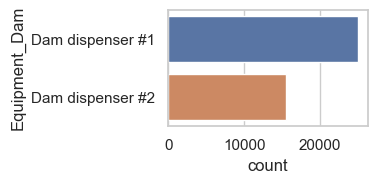


 +++++++++ unique 확인 / target 별 +++++++++
target            AbNormal    Normal
Equipment_Dam                       
Dam dispenser #1  0.631915  0.617072
Dam dispenser #2  0.368085  0.382928


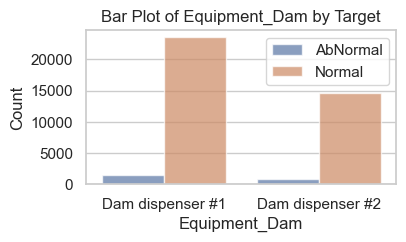

In [16]:
data_ana(DA_data, 'Equipment_Dam')

+++++++++ unique 확인 +++++++++
AJX75334501    33820
AJX75334502     3390
AJX75334505     2635
AJX75334507      310
AJX75334503      162
AJX75334506      129
AJX75334508       60
Name: Model.Suffix_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


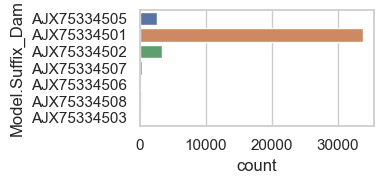


 +++++++++ unique 확인 / target 별 +++++++++
target            AbNormal    Normal
Model.Suffix_Dam                    
AJX75334501       0.816170  0.836094
AJX75334502       0.097872  0.082818
AJX75334503       0.018723  0.003093
AJX75334505       0.055319  0.065652
AJX75334506       0.003404  0.003171
AJX75334507       0.007660  0.007653
AJX75334508       0.000851  0.001520


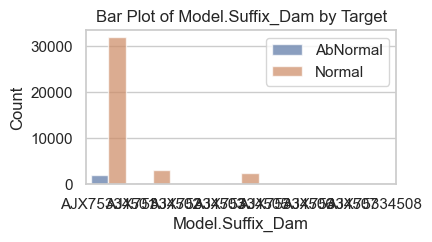

In [17]:
data_ana(DA_data, 'Model.Suffix_Dam')

+++++++++ unique 확인 +++++++++
3L1X8574-2       272
3K1XC268-1       227
3L1X9934-1       217
3L1X8506-1       217
3K1XA586-2       189
                ... 
4BPM0084-1         2
3FPXX064-0003      2
3H1XB714-1         1
4CPM0166-1         1
3HPM0061-1         1
Name: Workorder_Dam, Length: 663, dtype: int64

 +++++++++ 시각화 +++++++++


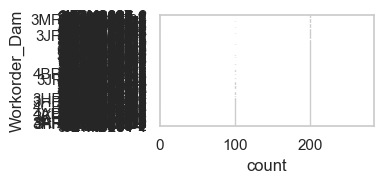


 +++++++++ unique 확인 / target 별 +++++++++
target         AbNormal    Normal
Workorder_Dam                    
3F1X5847-2     0.005106  0.002464
3F1X9643-1     0.002979  0.003669
3F1X9644-1     0.006809  0.003695
3F1X9648-1     0.004255  0.003931
3F1X9648-2     0.000426  0.000446
...                 ...       ...
4F1XB043-1     0.000426  0.000681
4F1XB596-1     0.001277  0.003695
4F1XB738-1     0.000000  0.000472
4F1XB758-1     0.000851  0.001966
4F1XB758-2     0.004255  0.000917

[663 rows x 2 columns]


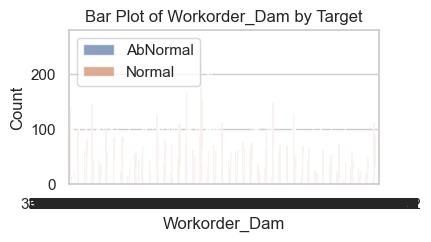

In [18]:
data_ana(DA_data, 'Workorder_Dam')

Workorder_Dam 데이터의 경우 범주형이면서 수치형 데이터처럼 값이 많아 확인하기 어려움. 단, 해당 변수의 이름을 보면 어느정도의 규칙을 찾을 수 있음. 이를 파생 변수로 만든다면?

더군다나 총 데이터는 약 4만개, 해당 변수는 663개로 그저 랜덤한 값이 아닐것이라 예상

In [106]:
# 값 분리 및 변환 함수
def split_and_separate(row):
    # '-'를 기준으로 문자열 분리
    parts = row.split('-')
    if len(parts) == 2:
        # 대시 이전 부분을 문자 단위로 분리
        before_dash = [char for char in parts[0]]
        # 대시 이후 부분은 전체를 하나의 값으로 처리
        after_dash = [parts[1]]
        return before_dash + after_dash
    else:
        # 분리된 부분이 예상과 다르면 오류 처리
        return [None] * (len(parts[0]) + 1)

# 적용 및 DataFrame 변환
max_length = DA_data['Workorder_Dam'].apply(lambda x: len(x.split('-')[0]) + 1).max()
column_names = [f'char_{i+1}_Dam' for i in range(max_length - 1)] + ['after_dash_Dam']
df_transformed = pd.DataFrame(DA_data['Workorder_Dam'].apply(split_and_separate).tolist(), columns=column_names)

In [107]:
for i in df_transformed.columns:
    print('+++', '\n', f'{i}')
    print(df_transformed[i].value_counts())
    print('\n')

+++ 
 char_1_Dam
3    27603
4    12903
Name: char_1_Dam, dtype: int64


+++ 
 char_2_Dam
M    4664
G    4631
J    4157
A    3975
L    3818
H    3494
K    3310
B    3062
E    2742
F    2262
I    2227
C    2164
Name: char_2_Dam, dtype: int64


+++ 
 char_3_Dam
1    39493
P     1013
Name: char_3_Dam, dtype: int64


+++ 
 char_4_Dam
X    39882
M      624
Name: char_4_Dam, dtype: int64


+++ 
 char_5_Dam
B    7225
A    6187
C    5882
9    3888
E    2933
8    2472
H    2149
D    2097
0    1568
F    1351
G    1285
7     871
1     833
X     389
4     322
J     297
2     297
3     192
6     162
5     106
Name: char_5_Dam, dtype: int64


+++ 
 char_6_Dam
4    4912
5    4880
6    4521
9    4472
3    4423
0    4421
2    4253
8    3156
1    2740
7    2728
Name: char_6_Dam, dtype: int64


+++ 
 char_7_Dam
4    6300
7    5559
3    5056
8    4514
9    3533
5    3447
2    3441
6    3048
0    2807
1    2801
Name: char_7_Dam, dtype: int64


+++ 
 char_8_Dam
4    5434
8    4809
6    4498
7    4192
5    41

In [108]:
DA_data = pd.concat([DA_data, df_transformed], axis=1)
DA_data = DA_data.drop('Workorder_Dam', axis=1)

+++++++++ unique 확인 +++++++++
3    27603
4    12903
Name: char_1_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


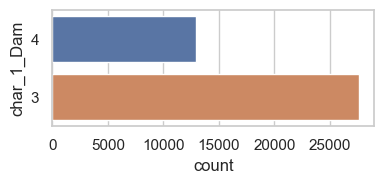


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_1_Dam                    
3           0.742128  0.677718
4           0.257872  0.322282


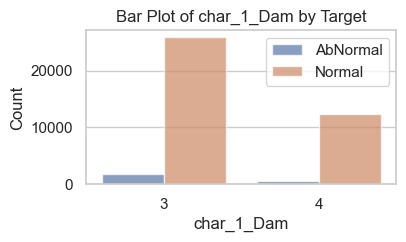

In [22]:
data_ana(DA_data, 'char_1_Dam')

+++++++++ unique 확인 +++++++++
M    4664
G    4631
J    4157
A    3975
L    3818
H    3494
K    3310
B    3062
E    2742
F    2262
I    2227
C    2164
Name: char_2_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


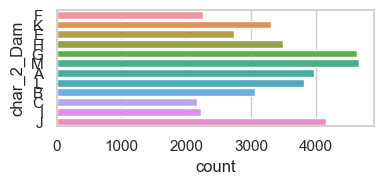


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_2_Dam                    
A           0.082979  0.099067
B           0.049787  0.077183
C           0.040851  0.054199
E           0.062128  0.068036
F           0.070213  0.054959
G           0.185532  0.109943
H           0.135745  0.083211
I           0.070213  0.054041
J           0.082553  0.103863
K           0.049787  0.083683
L           0.061277  0.096289
M           0.108936  0.115526


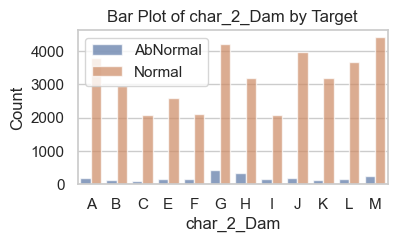

In [23]:
data_ana(DA_data, 'char_2_Dam')

+++++++++ unique 확인 +++++++++
1    39493
P     1013
Name: char_3_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


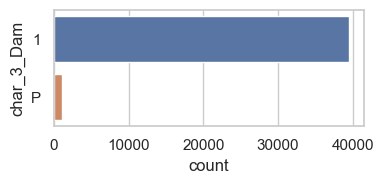


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_3_Dam                    
1           0.958723  0.975993
P           0.041277  0.024007


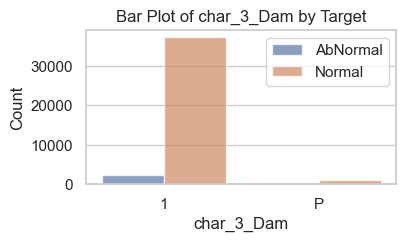

In [24]:
data_ana(DA_data, 'char_3_Dam')

+++++++++ unique 확인 +++++++++
X    39882
M      624
Name: char_4_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


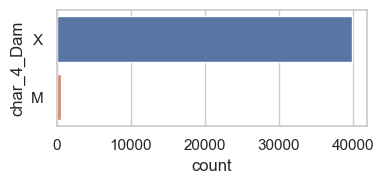


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_4_Dam                    
M           0.009787  0.015751
X           0.990213  0.984249


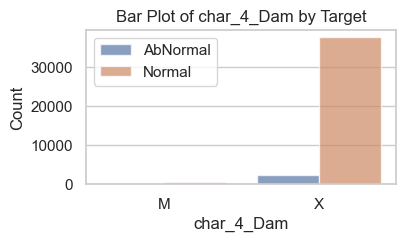

In [25]:
data_ana(DA_data, 'char_4_Dam')

+++++++++ unique 확인 +++++++++
B    7225
A    6187
C    5882
9    3888
E    2933
8    2472
H    2149
D    2097
0    1568
F    1351
G    1285
7     871
1     833
X     389
4     322
J     297
2     297
3     192
6     162
5     106
Name: char_5_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


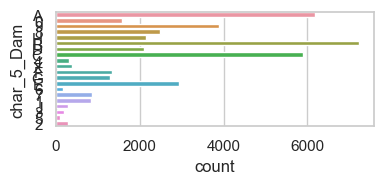


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_5_Dam                    
0           0.022128  0.039732
1           0.012340  0.021071
2           0.005532  0.007443
3           0.008936  0.004482
4           0.007234  0.007994
5           0.005106  0.002464
6           0.001702  0.004141
7           0.026383  0.021202
8           0.071064  0.060410
9           0.082128  0.096839
A           0.176596  0.151274
B           0.165106  0.179185
C           0.145957  0.145167
D           0.045106  0.052181
E           0.086809  0.071522
F           0.033617  0.033337
G           0.020851  0.032393
H           0.045532  0.053517
J           0.006383  0.007391
X           0.031489  0.008256


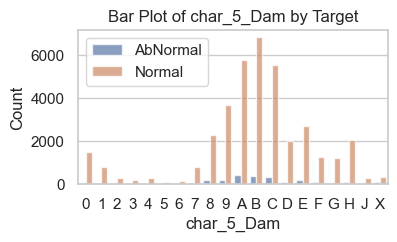

In [26]:
data_ana(DA_data, 'char_5_Dam')

+++++++++ unique 확인 +++++++++
4    4912
5    4880
6    4521
9    4472
3    4423
0    4421
2    4253
8    3156
1    2740
7    2728
Name: char_6_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


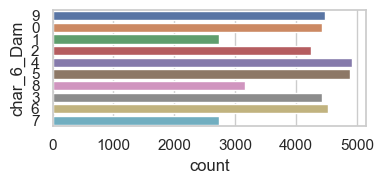


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_6_Dam                    
0           0.125106  0.108161
1           0.060000  0.068115
2           0.113191  0.104492
3           0.108511  0.109236
4           0.132340  0.120584
5           0.098723  0.121816
6           0.112340  0.111568
7           0.054894  0.068115
8           0.064255  0.078756
9           0.130638  0.109157


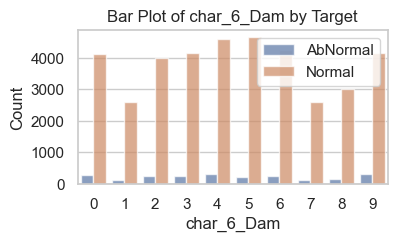

In [27]:
data_ana(DA_data, 'char_6_Dam')

+++++++++ unique 확인 +++++++++
4    6300
7    5559
3    5056
8    4514
9    3533
5    3447
2    3441
6    3048
0    2807
1    2801
Name: char_7_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


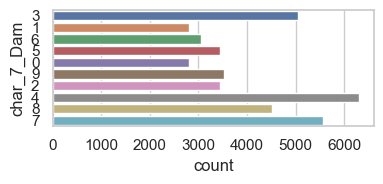


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_7_Dam                    
0           0.088085  0.068141
1           0.065106  0.069399
2           0.068511  0.085963
3           0.113617  0.125511
4           0.151064  0.155808
5           0.104255  0.083919
6           0.065532  0.075847
7           0.121277  0.138222
8           0.119574  0.110939
9           0.102979  0.086251


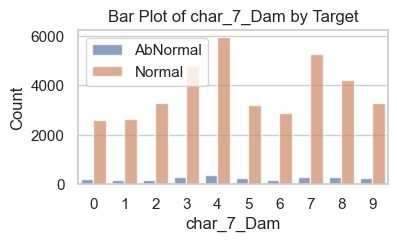

In [28]:
data_ana(DA_data, 'char_7_Dam')

+++++++++ unique 확인 +++++++++
4    5434
8    4809
6    4498
7    4192
5    4164
1    3673
2    3651
9    3510
0    3447
3    3128
Name: char_8_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


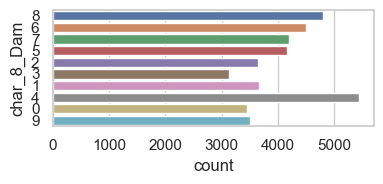


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_8_Dam                    
0           0.082128  0.085281
1           0.079149  0.091388
2           0.094043  0.089894
3           0.070638  0.077629
4           0.158723  0.132640
5           0.091915  0.103470
6           0.101277  0.111647
7           0.112766  0.102920
8           0.124255  0.118382
9           0.085106  0.086749


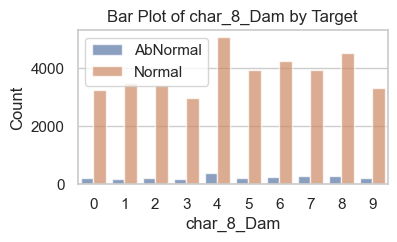

In [29]:
data_ana(DA_data, 'char_8_Dam')

+++++++++ unique 확인 +++++++++
1       33647
2        6092
0001      362
3         197
4         181
0002       25
0003        2
Name: after_dash_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


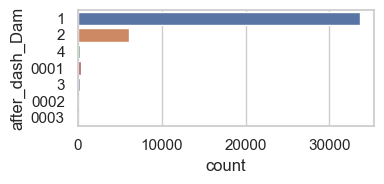


 +++++++++ unique 확인 / target 별 +++++++++
target          AbNormal    Normal
after_dash_Dam                    
0001            0.030638  0.007600
0002            0.000851  0.000603
0003            0.000000  0.000052
1               0.821277  0.831245
2               0.140426  0.151012
3               0.002553  0.005006
4               0.004255  0.004482


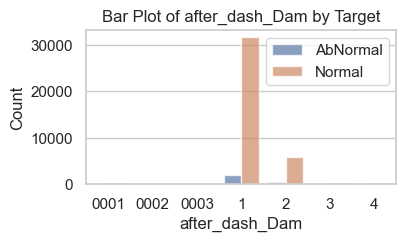

In [30]:
data_ana(DA_data, 'after_dash_Dam')

분석 결과 char_1, 2, after_dash외에는 3% 이상의 차이를 보이지 못함.

In [31]:
DA_data = DA_data.drop(['char_3_Dam', 'char_4_Dam', 'char_5_Dam',
                        'char_6_Dam', 'char_7_Dam', 'char_8_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
240.0     25030
1000.0    15476
Name: CURE END POSITION X Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


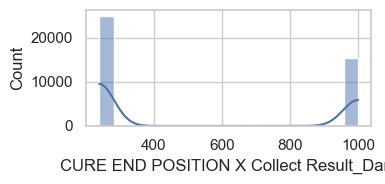


 +++++++++ unique 확인 / target 별 +++++++++
target                                  AbNormal    Normal
CURE END POSITION X Collect Result_Dam                    
240.0                                   0.631915  0.617072
1000.0                                  0.368085  0.382928


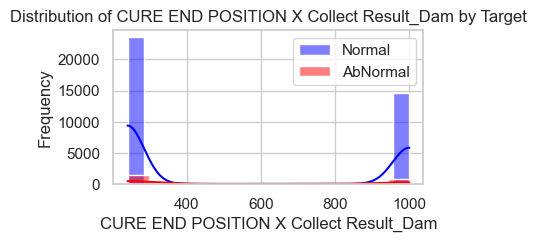

In [32]:
data_ana(DA_data, 'CURE END POSITION X Collect Result_Dam')

+++++++++ unique 확인 +++++++++
2.5     25030
12.5    15476
Name: CURE END POSITION Z Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


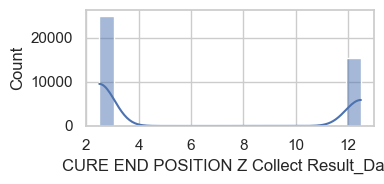


 +++++++++ unique 확인 / target 별 +++++++++
target                                  AbNormal    Normal
CURE END POSITION Z Collect Result_Dam                    
2.5                                     0.631915  0.617072
12.5                                    0.368085  0.382928


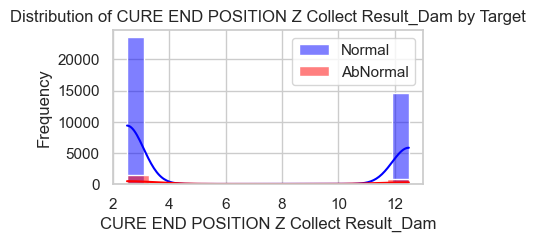

In [33]:
data_ana(DA_data, 'CURE END POSITION Z Collect Result_Dam')

+++++++++ unique 확인 +++++++++
-90    25030
 90    15476
Name: CURE END POSITION Θ Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


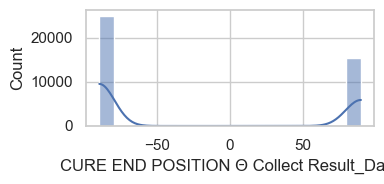


 +++++++++ unique 확인 / target 별 +++++++++
target                                  AbNormal    Normal
CURE END POSITION Θ Collect Result_Dam                    
-90                                     0.631915  0.617072
 90                                     0.368085  0.382928


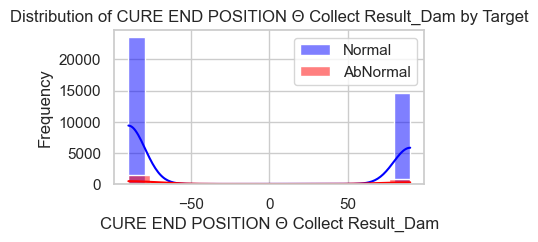

In [34]:
data_ana(DA_data, 'CURE END POSITION Θ Collect Result_Dam')

CURE END POSITION 좌표의 경우 모든 경우에서 세 좌표가 같은 범주를 지님
> CURE END POSITION 데이터로 차원 합치기

In [109]:
DA_data['CURE END POSITION Result_Dam'] = DA_data.apply(lambda row: (row['CURE END POSITION X Collect Result_Dam'],
                                                           row['CURE END POSITION Z Collect Result_Dam'],
                                                           row['CURE END POSITION Θ Collect Result_Dam']), axis=1)

In [110]:
DA_data = DA_data.drop(['CURE END POSITION X Collect Result_Dam', 'CURE END POSITION Z Collect Result_Dam',
                       'CURE END POSITION Θ Collect Result_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
70     34429
85      2213
100     2065
105     1640
95       159
Name: CURE SPEED Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


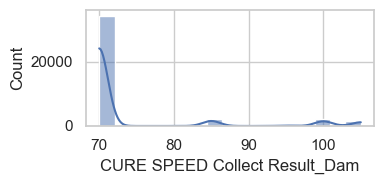


 +++++++++ unique 확인 / target 별 +++++++++
target                         AbNormal    Normal
CURE SPEED Collect Result_Dam                    
70                             0.873191  0.848543
85                             0.054043  0.054670
95                             0.001702  0.004062
100                            0.039574  0.051683
105                            0.031489  0.041042


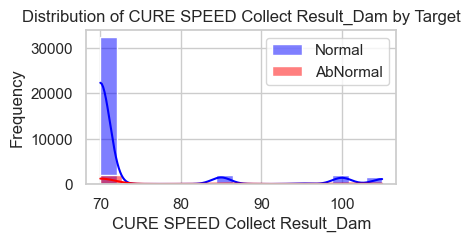

In [37]:
data_ana(DA_data, 'CURE SPEED Collect Result_Dam')

+++++++++ unique 확인 +++++++++
1030    25030
280     15476
Name: CURE START POSITION X Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


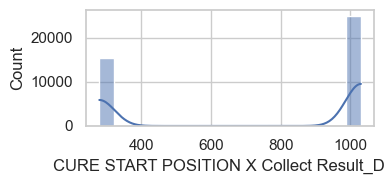


 +++++++++ unique 확인 / target 별 +++++++++
target                                    AbNormal    Normal
CURE START POSITION X Collect Result_Dam                    
280                                       0.368085  0.382928
1030                                      0.631915  0.617072


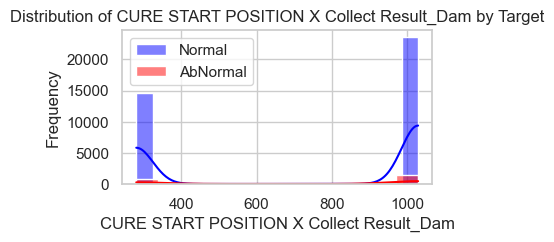

In [38]:
data_ana(DA_data, 'CURE START POSITION X Collect Result_Dam')

+++++++++ unique 확인 +++++++++
-90    25030
 90    15476
Name: CURE START POSITION Θ Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


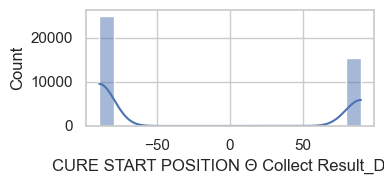


 +++++++++ unique 확인 / target 별 +++++++++
target                                    AbNormal    Normal
CURE START POSITION Θ Collect Result_Dam                    
-90                                       0.631915  0.617072
 90                                       0.368085  0.382928


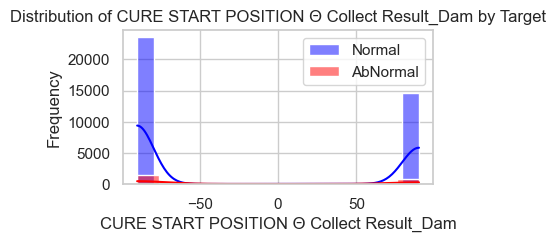

In [39]:
data_ana(DA_data, 'CURE START POSITION Θ Collect Result_Dam')

이들도 조합화

In [111]:
DA_data['CURE START POSITION Result_Dam'] = DA_data.apply(lambda row: (row['CURE START POSITION X Collect Result_Dam'],
                                                           row['CURE START POSITION Θ Collect Result_Dam']), axis=1)

In [112]:
DA_data = DA_data.drop(['CURE START POSITION X Collect Result_Dam',
                       'CURE START POSITION Θ Collect Result_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
(1030, -90)    25030
(280, 90)      15476
Name: CURE START POSITION Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


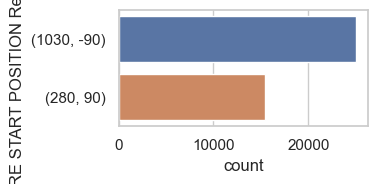


 +++++++++ unique 확인 / target 별 +++++++++
target                          AbNormal    Normal
CURE START POSITION Result_Dam                    
(280, 90)                       0.368085  0.382928
(1030, -90)                     0.631915  0.617072


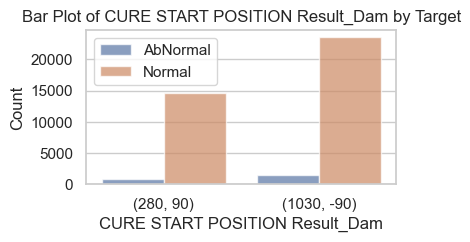

In [42]:
data_ana(DA_data, 'CURE START POSITION Result_Dam')

START/END도 합치기

In [113]:
DA_data['CURE START/END POSITION Result_Dam'] = DA_data.apply(lambda row: (row['CURE START POSITION Result_Dam'],
                                                           row['CURE END POSITION Result_Dam']), axis=1)

In [114]:
DA_data = DA_data.drop(['CURE START POSITION Result_Dam',
                       'CURE END POSITION Result_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
((1030, -90), (240.0, 2.5, -90))    25030
((280, 90), (1000.0, 12.5, 90))     15476
Name: CURE START/END POSITION Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


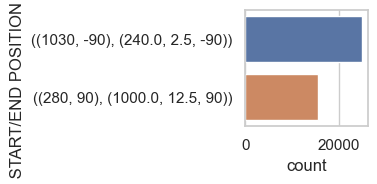


 +++++++++ unique 확인 / target 별 +++++++++
target                              AbNormal    Normal
CURE START/END POSITION Result_Dam                    
((280, 90), (1000.0, 12.5, 90))     0.368085  0.382928
((1030, -90), (240.0, 2.5, -90))    0.631915  0.617072


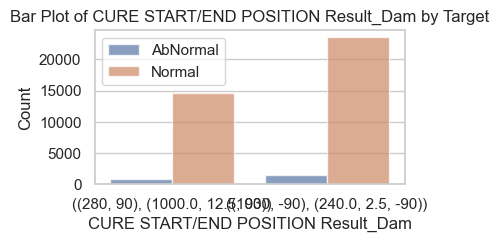

In [45]:
data_ana(DA_data, 'CURE START/END POSITION Result_Dam')

+++++++++ unique 확인 +++++++++
10    21046
16    19456
15        4
Name: DISCHARGED SPEED OF RESIN Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


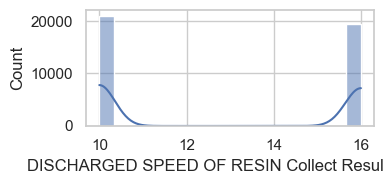


 +++++++++ unique 확인 / target 별 +++++++++
target                                        AbNormal    Normal
DISCHARGED SPEED OF RESIN Collect Result_Dam                    
10                                            0.598298  0.514729
15                                            0.000426  0.000079
16                                            0.401277  0.485192


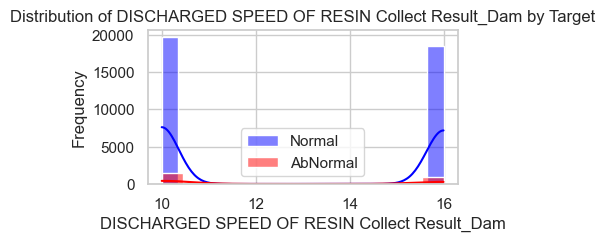

In [46]:
data_ana(DA_data, 'DISCHARGED SPEED OF RESIN Collect Result_Dam')

15의 값을 가지는 4개의 데이터중에 3개의 데이터가 불량이기 때문에 단순히 삭제하면 안될 듯 함.
test data에도 15의 값을 지니는지 확인 필요

In [47]:
test_data['DISCHARGED SPEED OF RESIN Collect Result_Dam'].value_counts()

10    8944
16    8415
15       2
Name: DISCHARGED SPEED OF RESIN Collect Result_Dam, dtype: int64

test data 또한 15값이 존재. 알고리즘상 과적합 시키면 15값을 지닌 test 인스턴스를 무조건 불량으로 판단할 듯함.(선형으로만 봤을 때). 실제로 레진의 도포에 있어서 스피드가 중요할 수 있음
> 토의 필요

+++++++++ unique 확인 +++++++++
13.2    11214
21.3     6050
9.7      5442
17.0     4880
9.6      4459
14.9     3904
14.2     1313
14.7     1293
13.1      824
13.8      273
13.5      261
13.6      235
11.6      106
14.8       98
21.2       92
14.3       29
17.1       21
13.7       11
10.6        1
Name: DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


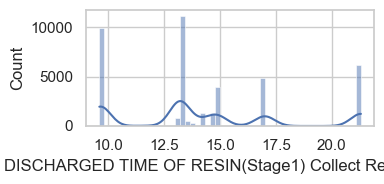


 +++++++++ unique 확인 / target 별 +++++++++
target                                              AbNormal    Normal
DISCHARGED TIME OF RESIN(Stage1) Collect Result...                    
9.6                                                 0.176170  0.106012
9.7                                                 0.178298  0.131644
10.6                                                0.000000  0.000026
11.6                                                0.005106  0.002464
13.1                                                0.020426  0.020338
13.2                                                0.228936  0.279799
13.5                                                0.001702  0.006736
13.6                                                0.002128  0.006028
13.7                                                0.000426  0.000262
13.8                                                0.005957  0.006788
14.2                                                0.026809  0.032760
14.3                              

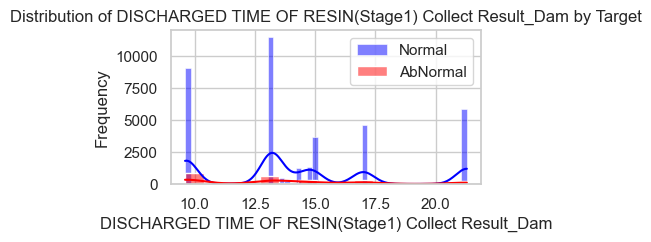

In [48]:
data_ana(DA_data, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam')

레진의 도포 스피드와 시간의 상관을 확인. 스피드가 높으면 시간을 적게?

In [49]:
DA_data[['DISCHARGED SPEED OF RESIN Collect Result_Dam', 
        'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
        'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
        'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam']].corr()

,DISCHARGED SPEED OF RESIN Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam
DISCHARGED SPEED OF RESIN Collect Result_Dam,1.000000,-0.138566,0.422943,-0.146885
DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,-0.138566,1.000000,0.619393,0.999476
DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,0.422943,0.619393,1.000000,0.614492
DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam,-0.146885,0.999476,0.614492,1.000000


상관을 확인했을 때 꼭 그렇지는 않은 것 같음.

+++++++++ unique 확인 +++++++++
4.9     10312
8.4      3581
3.9      3333
6.6      2701
8.3      2354
10.5     2184
8.1      2063
10.6     1824
8.2      1630
6.5      1591
8.5      1565
8.6      1499
6.7      1079
5.0       998
7.5       990
7.6       934
7.7       569
4.8       513
5.4       275
5.5       165
3.8       109
7.2        75
7.9        54
8.0        41
7.1        34
4.0        27
5.8         3
5.9         2
6.9         1
Name: DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


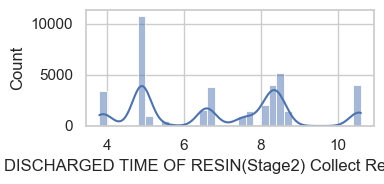


 +++++++++ unique 확인 / target 별 +++++++++
target                                              AbNormal    Normal
DISCHARGED TIME OF RESIN(Stage2) Collect Result...                    
3.8                                                 0.003404  0.002647
3.9                                                 0.123404  0.079752
4.0                                                 0.000851  0.000655
4.8                                                 0.021702  0.012108
4.9                                                 0.317872  0.250681
5.0                                                 0.026383  0.024531
5.4                                                 0.007660  0.006736
5.5                                                 0.004255  0.004062
5.8                                                 0.000426  0.000052
5.9                                                 0.000426  0.000026
6.5                                                 0.035319  0.039522
6.6                               

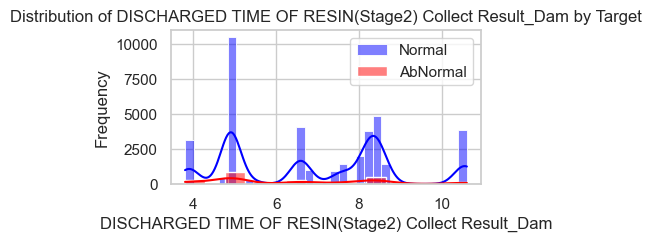

In [50]:
data_ana(DA_data, 'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam')

+++++++++ unique 확인 +++++++++
13.2    9511
9.7     8562
21.3    5962
14.7    4701
17.0    3969
13.1    2451
9.6     1331
17.1     932
14.2     899
14.8     594
14.3     524
13.6     323
13.8     260
13.5     173
21.2     171
11.6      97
13.7      24
11.5       9
9.8        8
21.4       5
Name: DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


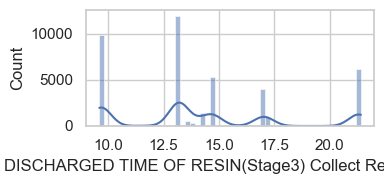


 +++++++++ unique 확인 / target 별 +++++++++
target                                              AbNormal    Normal
DISCHARGED TIME OF RESIN(Stage3) Collect Result...                    
9.6                                                 0.054894  0.031502
9.7                                                 0.299574  0.205944
9.8                                                 0.000000  0.000210
11.5                                                0.000851  0.000183
11.6                                                0.004255  0.002280
13.1                                                0.046383  0.061380
13.2                                                0.200851  0.236896
13.5                                                0.000426  0.004508
13.6                                                0.003404  0.008256
13.7                                                0.000426  0.000603
13.8                                                0.005957  0.006447
14.2                              

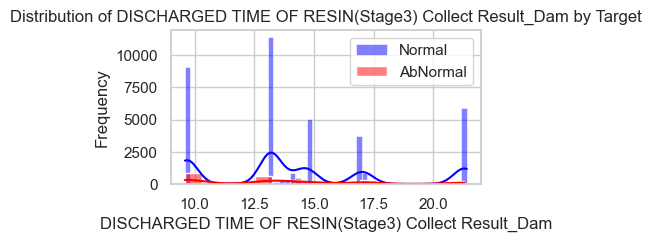

In [51]:
data_ana(DA_data, 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam')

+++++++++ unique 확인 +++++++++
0.67    9901
0.92    8033
1.49    6046
1.19    4901
1.45    3181
1.04    1997
1.63    1907
0.99    1276
1.61     771
0.91     578
1.02     522
0.96     273
0.94     261
0.95     246
1.44     246
0.81     106
1.48      92
1.62      49
1.03      49
1.56      37
1.00      29
2.34       4
0.74       1
Name: Dispense Volume(Stage1) Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


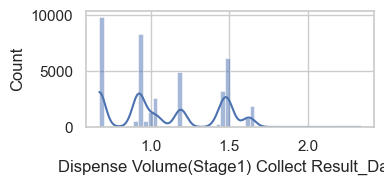


 +++++++++ unique 확인 / target 별 +++++++++
target                                      AbNormal    Normal
Dispense Volume(Stage1) Collect Result_Dam                    
0.67                                        0.354468  0.237656
0.74                                        0.000000  0.000026
0.81                                        0.005106  0.002464
0.91                                        0.014468  0.014257
0.92                                        0.154468  0.201017
0.94                                        0.001702  0.006736
0.95                                        0.002553  0.006290
0.96                                        0.005957  0.006788
0.99                                        0.024255  0.031948
1.00                                        0.000851  0.000708
1.02                                        0.005106  0.013366
1.03                                        0.000851  0.001232
1.04                                        0.043830  0.049638
1.19        

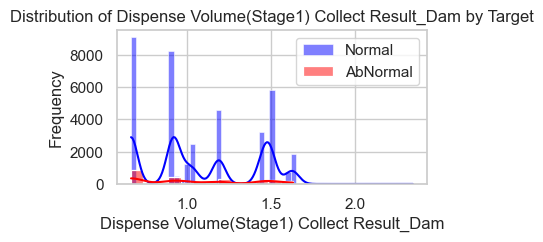

In [52]:
data_ana(DA_data, 'Dispense Volume(Stage1) Collect Result_Dam')

+++++++++ unique 확인 +++++++++
0.34    10312
0.58     4719
0.27     3333
0.73     2458
0.56     2089
0.72     1959
0.74     1824
0.57     1618
0.46     1547
0.53     1503
0.92     1206
0.71     1198
0.35      998
0.52      990
0.93      803
0.60      781
0.59      762
0.94      718
0.33      513
0.45      393
0.37      275
0.38      165
0.26      109
0.50       75
0.55       54
0.49       34
0.28       27
0.89       15
0.90       12
0.91       10
0.40        3
0.41        2
0.48        1
Name: Dispense Volume(Stage2) Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


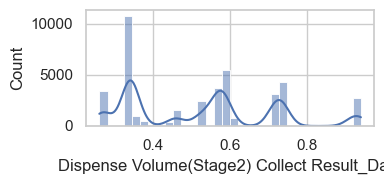


 +++++++++ unique 확인 / target 별 +++++++++
target                                      AbNormal    Normal
Dispense Volume(Stage2) Collect Result_Dam                    
0.26                                        0.003404  0.002647
0.27                                        0.123404  0.079752
0.28                                        0.000851  0.000655
0.33                                        0.021702  0.012108
0.34                                        0.317872  0.250681
0.35                                        0.026383  0.024531
0.37                                        0.007660  0.006736
0.38                                        0.004255  0.004062
0.40                                        0.000426  0.000052
0.41                                        0.000426  0.000026
0.45                                        0.008511  0.009776
0.46                                        0.040851  0.038028
0.48                                        0.000000  0.000026
0.49        

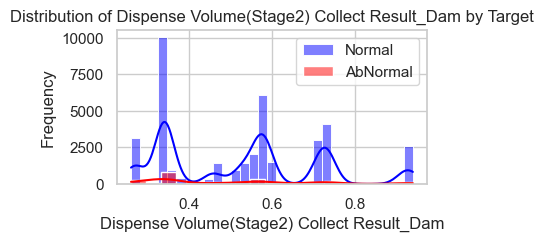

In [53]:
data_ana(DA_data, 'Dispense Volume(Stage2) Collect Result_Dam')

+++++++++ unique 확인 +++++++++
0.67    9893
0.92    6800
1.49    5967
1.19    4901
1.45    2711
1.61    2417
1.02    2284
0.91    1731
0.99     872
1.44     720
1.00     514
0.95     347
1.62     310
1.03     284
0.96     260
0.94     173
1.48     171
0.81      97
1.56      27
1.57      10
0.80       9
0.68       8
Name: Dispense Volume(Stage3) Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


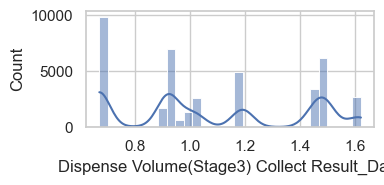


 +++++++++ unique 확인 / target 별 +++++++++
target                                      AbNormal    Normal
Dispense Volume(Stage3) Collect Result_Dam                    
0.67                                        0.354468  0.237446
0.68                                        0.000000  0.000210
0.80                                        0.000851  0.000183
0.81                                        0.004255  0.002280
0.91                                        0.030213  0.043506
0.92                                        0.136596  0.169803
0.94                                        0.000426  0.004508
0.95                                        0.003830  0.008858
0.96                                        0.005957  0.006447
0.99                                        0.017021  0.021805
1.00                                        0.010213  0.012842
1.02                                        0.047234  0.056950
1.03                                        0.002553  0.007286
1.19        

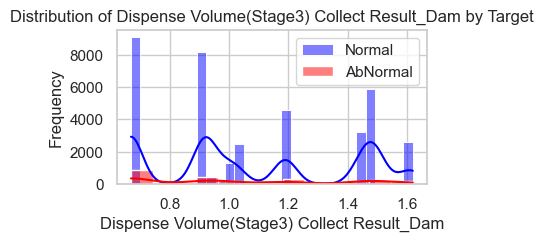

In [54]:
data_ana(DA_data, 'Dispense Volume(Stage3) Collect Result_Dam')

+++++++++ unique 확인 +++++++++
0.67    9893
0.92    6800
1.49    5967
1.19    4901
1.45    2711
1.61    2417
1.02    2284
0.91    1731
0.99     872
1.44     720
1.00     514
0.95     347
1.62     310
1.03     284
0.96     260
0.94     173
1.48     171
0.81      97
1.56      27
1.57      10
0.80       9
0.68       8
Name: Dispense Volume(Stage3) Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


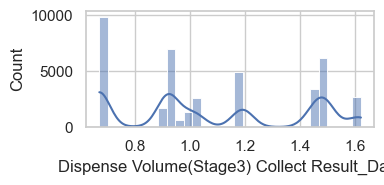


 +++++++++ unique 확인 / target 별 +++++++++
target                                      AbNormal    Normal
Dispense Volume(Stage3) Collect Result_Dam                    
0.67                                        0.354468  0.237446
0.68                                        0.000000  0.000210
0.80                                        0.000851  0.000183
0.81                                        0.004255  0.002280
0.91                                        0.030213  0.043506
0.92                                        0.136596  0.169803
0.94                                        0.000426  0.004508
0.95                                        0.003830  0.008858
0.96                                        0.005957  0.006447
0.99                                        0.017021  0.021805
1.00                                        0.010213  0.012842
1.02                                        0.047234  0.056950
1.03                                        0.002553  0.007286
1.19        

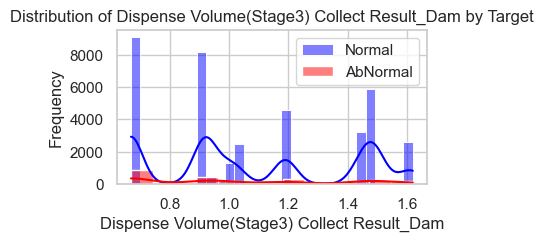

In [55]:
data_ana(DA_data, 'Dispense Volume(Stage3) Collect Result_Dam')

+++++++++ unique 확인 +++++++++
NG       12766
OK       11293
549       7271
162.4     3580
550       2398
550.3     1909
549.5     1263
548.5       26
Name: HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


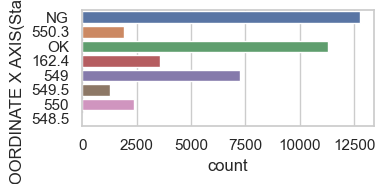


 +++++++++ unique 확인 / target 별 +++++++++
target                                              AbNormal    Normal
HEAD NORMAL COORDINATE X AXIS(Stage1) Collect R...                    
162.4                                               0.099574  0.087693
548.5                                               0.001702  0.000577
549                                                 0.275319  0.173603
549.5                                               0.047234  0.030192
550                                                 0.053617  0.059545
550.3                                               0.035745  0.047830
NG                                                  0.275745  0.317591
OK                                                  0.211064  0.282970


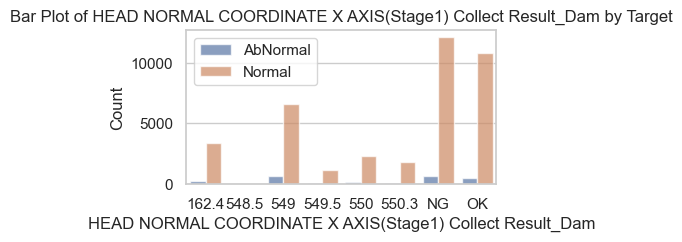

In [56]:
data_ana(DA_data, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam')

+++++++++ unique 확인 +++++++++
NaN    29213
OK     11293
Name: HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


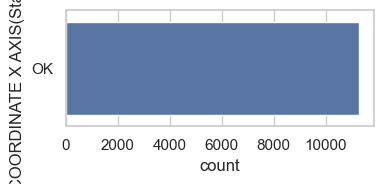


 +++++++++ unique 확인 / target 별 +++++++++
target                                              AbNormal  Normal
HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Val...                  
OK                                                       1.0     1.0


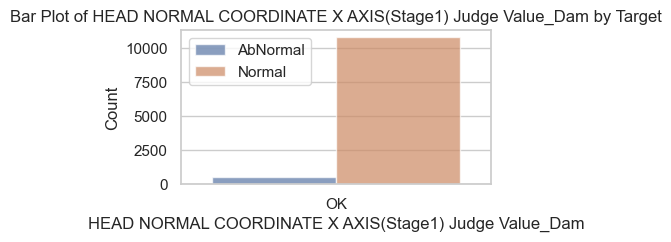

In [57]:
data_ana(train_data, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam')

해당 변수를 보면, Judge value의 OK 가 HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam로 오버레이 된거 같음

+++++++++ unique 확인 +++++++++
377.5     8560
377.3     4307
552.0     4030
161.3     2416
553.6     2358
162.3     1920
551.7     1907
1269.0    1779
161.5     1763
160.8     1612
162.6     1465
553.4     1059
1271.3    1056
159.8      843
550.5      826
161.4      747
1271.8     745
553.1      547
551.0      489
162.9      446
160.3      446
161.2      256
552.9      243
553.2      217
162.2      126
162.1      102
552.3       67
552.6       46
553.0       38
552.4       38
554.0       26
162.5       20
552.7        3
553.7        1
161.9        1
552.2        1
Name: HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


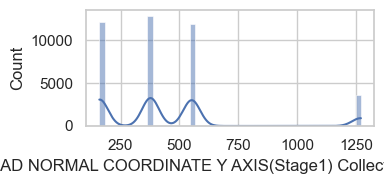


 +++++++++ unique 확인 / target 별 +++++++++
target                                              AbNormal    Normal
HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect R...                    
159.8                                               0.008936  0.021543
160.3                                               0.006383  0.011296
160.8                                               0.022979  0.040832
161.2                                               0.002128  0.006578
161.3                                               0.058298  0.059728
161.4                                               0.018298  0.018451
161.5                                               0.028511  0.044449
161.9                                               0.000000  0.000026
162.1                                               0.002128  0.002542
162.2                                               0.002128  0.003171
162.3                                               0.036170  0.048092
162.5                             

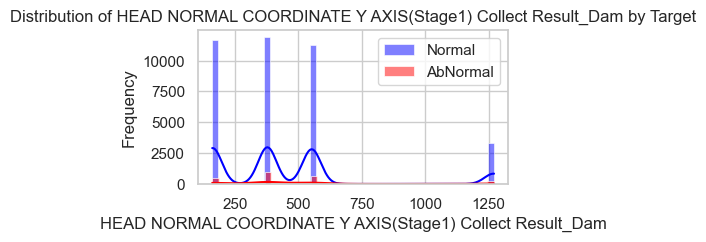

In [58]:
data_ana(DA_data, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam')

+++++++++ unique 확인 +++++++++
1271.80    10465
282.15      7885
284.80      7769
377.60      7362
378.00      3402
384.00      1028
284.60       793
1281.20      535
377.30       371
1272.10      281
1281.40      230
1282.00      169
1281.50       84
1273.80       64
1280.80       59
1281.30        9
Name: HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


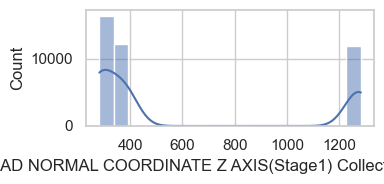


 +++++++++ unique 확인 / target 별 +++++++++
target                                              AbNormal    Normal
HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect R...                    
282.15                                              0.188936  0.195015
284.60                                              0.030213  0.018922
284.80                                              0.294043  0.185502
377.30                                              0.003830  0.009487
377.60                                              0.134894  0.184637
378.00                                              0.057447  0.085622
384.00                                              0.022128  0.025579
1271.80                                             0.223404  0.260509
1272.10                                             0.003830  0.007129
1273.80                                             0.018298  0.000550
1280.80                                             0.000000  0.001546
1281.20                           

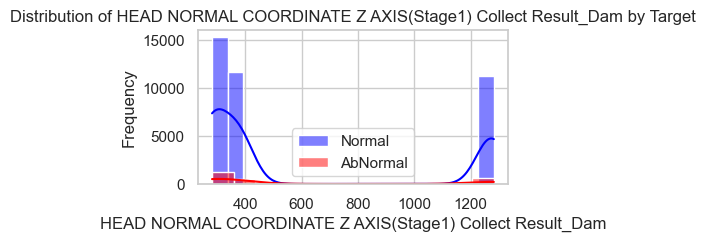

In [59]:
data_ana(DA_data, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam')

X의 OK를 채우기 위해 Stage2, Stage3를 확인해보자.

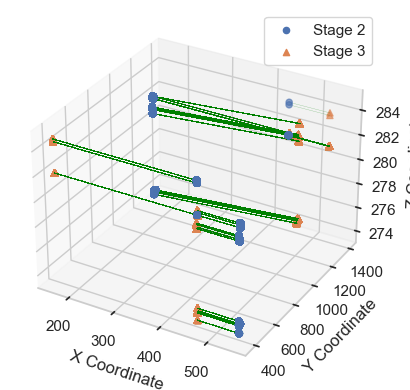

In [60]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Stage 2의 점을 플로팅
ax.scatter(DA_data['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam'],
           DA_data['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'],
           DA_data['HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam'],
           marker='o', label='Stage 2')

# Stage 3의 점을 플로팅
ax.scatter(DA_data['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'],
           DA_data['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'],
           DA_data['HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam'],
            marker='^', label='Stage 3')

# Stage 2에서 Stage 3로 이어지는 선을 플로팅
for i in range(len(DA_data)):
    ax.plot([DA_data['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam'][i], DA_data['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'][i]],
            [DA_data['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'][i], DA_data['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'][i]],
            [DA_data['HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam'][i], DA_data['HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam'][i]],
            color='green', linewidth=0.2, alpha=0.5)

ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')
ax.legend()
plt.show()


S2, S3간의 관계를 보면 어느정도 일관성이 있는것을 확인할 수 있음. 사실상 z 좌표는 크게 변하지 않는 듯 함(아무래도 위에서 뿌리는 것이다 보니까)

OK항을 제외한 S1의 좌표도 포함해서 확인해보자

Index: 0 Stage 1 -> Stage 2 Line: [550.3, 377.3, 282.15] -> [463.8, 377.3, 282.15]
Index: 1 Stage 1 -> Stage 2 Line: [162.4, 1271.8, 282.15] -> [465.5, 1270.7, 282.15]
Index: 2 Stage 1 -> Stage 2 Line: [549.0, 377.5, 284.8] -> [462.5, 377.0, 284.8]
Index: 3 Stage 1 -> Stage 2 Line: [549.0, 377.5, 284.8] -> [463.0, 377.0, 284.8]
Index: 4 Stage 1 -> Stage 2 Line: [549.0, 377.5, 284.8] -> [462.5, 377.0, 284.8]
Index: 5 Stage 1 -> Stage 2 Line: [549.0, 377.5, 284.8] -> [462.5, 377.0, 284.8]
Index: 6 Stage 1 -> Stage 2 Line: [549.0, 377.5, 284.8] -> [463.0, 377.0, 284.8]
Index: 7 Stage 1 -> Stage 2 Line: [549.0, 377.5, 284.8] -> [463.0, 377.0, 284.8]
Index: 8 Stage 1 -> Stage 2 Line: [549.0, 377.5, 284.8] -> [463.0, 377.0, 284.8]
Index: 9 Stage 1 -> Stage 2 Line: [549.0, 377.5, 284.8] -> [463.0, 377.0, 284.8]
Index: 10 Stage 1 -> Stage 2 Line: [549.5, 377.5, 284.8] -> [463.0, 377.0, 284.8]
Index: 11 Stage 1 -> Stage 2 Line: [550.0, 377.3, 282.15] -> [463.5, 377.3, 282.15]
Index: 12 Stage 1 

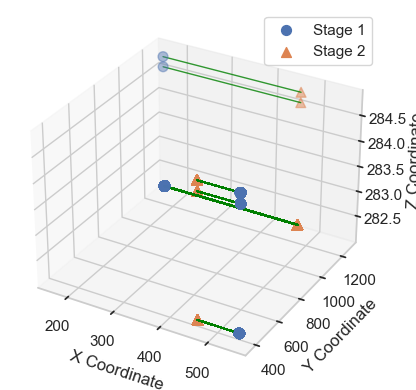

In [61]:
numeric_columns = [
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam'
]

# 'OK' 값을 가진 행 제거
DA_data_filtered = DA_data.copy()
DA_data_filtered = DA_data_filtered[DA_data_filtered['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] != 'OK']
DA_data_filtered = DA_data_filtered[DA_data_filtered['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] != 'NG']

# 숫자 열만 선택하여 float로 변환
DA_data_filtered[numeric_columns] = DA_data_filtered[numeric_columns].astype(float)
DA_data_filtered = DA_data_filtered.reset_index()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Stage 1과 Stage 2 플로팅
ax.scatter(DA_data_filtered['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'],
           DA_data_filtered['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'],
           DA_data_filtered['HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam'],
           marker='o', label='Stage 1', s=50)  # 점 크기 조정

ax.scatter(DA_data_filtered['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam'],
           DA_data_filtered['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'],
           DA_data_filtered['HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam'],
           marker='^', label='Stage 2', s=50)  # 점 크기 조정

# 연결 선 그리기
for i in range(len(DA_data_filtered)):
    print("Index:", i, "Stage 1 -> Stage 2 Line:", 
          DA_data_filtered.loc[i, ['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam']].tolist(),
          "->",
          DA_data_filtered.loc[i, ['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam']].tolist())
    
    ax.plot([DA_data_filtered['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'][i], DA_data_filtered['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam'][i]],
            [DA_data_filtered['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'][i], DA_data_filtered['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'][i]],
            [DA_data_filtered['HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam'][i], DA_data_filtered['HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam'][i]],
            color='green', linewidth=1, alpha=0.8)  # 선 두께와 투명도 조정


ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')
ax.legend()
plt.show()

시각화가 잘 되지 않아서 좌표들의 관계를 확인

In [62]:
# Stage 1의 X 좌표가 'OK'인 행 필터링
ok_filter = DA_data['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] == 'OK'
ng_filter = DA_data['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] == 'NG'

# Y 좌표의 고유값 확인
unique_y_values = DA_data.loc[ok_filter, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].unique()
print("Unique Y coordinates where X is 'OK':", '\n')
print(unique_y_values)

# Z 좌표의 고유값 확인
unique_z_values = DA_data.loc[ok_filter, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam'].unique()
print("Unique Z coordinates where X is 'OK':", '\n')
print(unique_z_values)

# Y 좌표의 고유값 확인
unique_y_values = DA_data.loc[ng_filter, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].unique()
print("Unique Y coordinates where X is 'NG':", '\n')
print(unique_y_values)

# Z 좌표의 고유값 확인
unique_z_values = DA_data.loc[ng_filter, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam'].unique()
print("Unique Z coordinates where X is 'NG':", '\n')
print(unique_z_values)

Unique Y coordinates where X is 'OK': 

[551.7 161.3 552.  551.  161.5 550.5 159.8 161.2 160.3]
Unique Z coordinates where X is 'OK': 

[1271.8  377.6  378. ]
Unique Y coordinates where X is 'NG': 

[161.4 553.6 552.  162.3 162.2 162.6 162.9 553.1 553.4 160.8 162.1 553.2
 552.9 553.  161.3 552.4 162.5 552.3 552.6 554.  161.5 553.7 552.7 161.9
 552.2]
Unique Z coordinates where X is 'NG': 

[ 384.  1271.8  377.6  378.  1272.1 1281.2 1281.4  377.3 1282.  1281.3
 1281.5 1273.8 1280.8]


Stage2, 3관계처럼 Stage 1, 2도 어느정도의 패턴이 있음. X가 OK인 경우는 Y가 551.. / 160.., Z가 1271../ 377..에 해당

때문에, 해당 범주에 속한 값들이(종속변수로 볼수있는) 애초에 존재하지 않아 결측치를 채우는 것이 힘들어보임

한가지 방법은 수치형이아니라 유사 값들(1~2차이 정도)을 범주로하여 보는것. 단 이는 정보를 손실시킬 가능성이 존재

+++++++++ unique 확인 +++++++++
257    24059
66     16447
Name: HEAD Standby Position Y Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


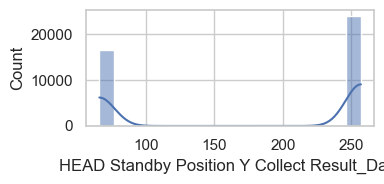


 +++++++++ unique 확인 / target 별 +++++++++
target                                      AbNormal    Normal
HEAD Standby Position Y Collect Result_Dam                    
66                                          0.513191  0.399439
257                                         0.486809  0.600561


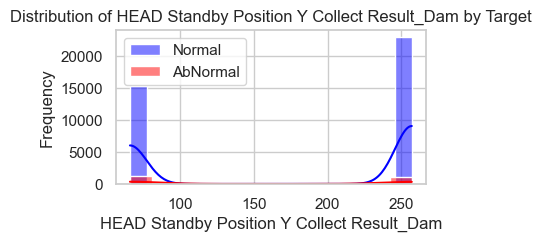

In [63]:
data_ana(DA_data, 'HEAD Standby Position Y Collect Result_Dam')

+++++++++ unique 확인 +++++++++
66    24059
0     16447
Name: HEAD Standby Position Z Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


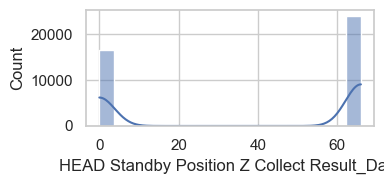


 +++++++++ unique 확인 / target 별 +++++++++
target                                      AbNormal    Normal
HEAD Standby Position Z Collect Result_Dam                    
0                                           0.513191  0.399439
66                                          0.486809  0.600561


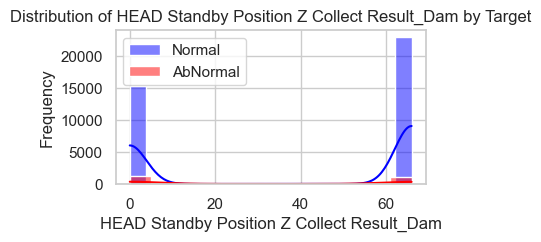

In [64]:
data_ana(DA_data, 'HEAD Standby Position Z Collect Result_Dam')

+++++++++ unique 확인 +++++++++
0.0      24059
127.5    16447
Name: Head Clean Position X Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


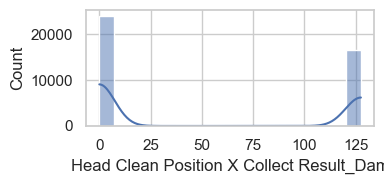


 +++++++++ unique 확인 / target 별 +++++++++
target                                    AbNormal    Normal
Head Clean Position X Collect Result_Dam                    
0.0                                       0.486809  0.600561
127.5                                     0.513191  0.399439


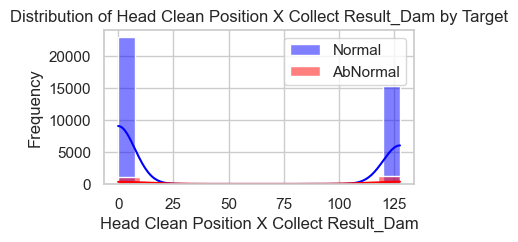

In [65]:
data_ana(DA_data, 'Head Clean Position X Collect Result_Dam')

+++++++++ unique 확인 +++++++++
127.5    24059
66.0     16447
Name: Head Clean Position Y Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


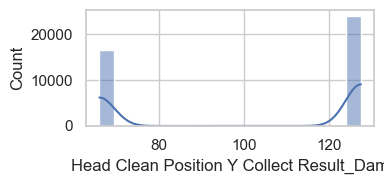


 +++++++++ unique 확인 / target 별 +++++++++
target                                    AbNormal    Normal
Head Clean Position Y Collect Result_Dam                    
66.0                                      0.513191  0.399439
127.5                                     0.486809  0.600561


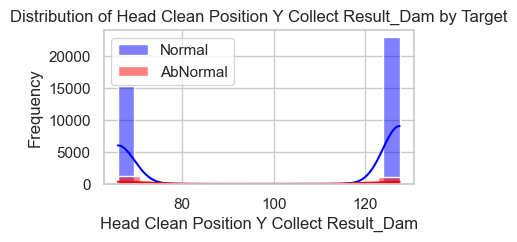

In [66]:
data_ana(DA_data, 'Head Clean Position Y Collect Result_Dam')

+++++++++ unique 확인 +++++++++
257    24059
66     16447
Name: Head Purge Position Y Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


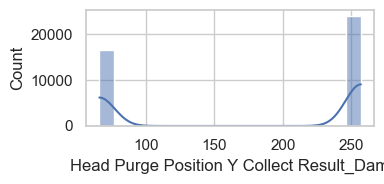


 +++++++++ unique 확인 / target 별 +++++++++
target                                    AbNormal    Normal
Head Purge Position Y Collect Result_Dam                    
66                                        0.513191  0.399439
257                                       0.486809  0.600561


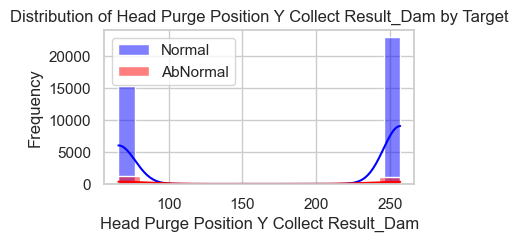

In [67]:
data_ana(DA_data, 'Head Purge Position Y Collect Result_Dam')

+++++++++ unique 확인 +++++++++
130.85    24059
505.00    16447
Name: Head Zero Position X Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


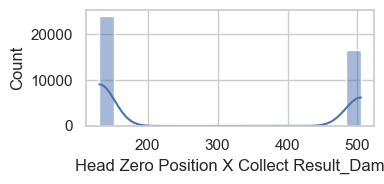


 +++++++++ unique 확인 / target 별 +++++++++
target                                   AbNormal    Normal
Head Zero Position X Collect Result_Dam                    
130.85                                   0.486809  0.600561
505.00                                   0.513191  0.399439


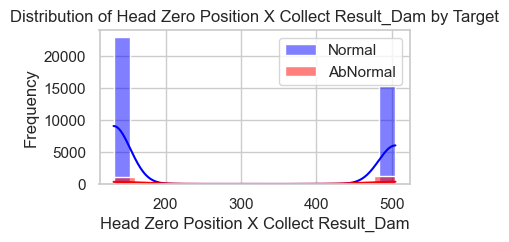

In [68]:
data_ana(DA_data, 'Head Zero Position X Collect Result_Dam')

위 값들은 모두 같은 비율
> 묶기

In [115]:
DA_data['HEAD same POSITION Result_Dam'] = DA_data.apply(lambda row: (row['HEAD Standby Position Y Collect Result_Dam'],
                                                           row['HEAD Standby Position Z Collect Result_Dam'],
                                                           row['Head Clean Position Y Collect Result_Dam'],
                                                           row['Head Purge Position Y Collect Result_Dam'],
                                                           row['Head Clean Position X Collect Result_Dam'],
                                                           row['Head Zero Position X Collect Result_Dam']), axis=1)
DA_data = DA_data.drop(['HEAD Standby Position Y Collect Result_Dam', 'HEAD Standby Position Z Collect Result_Dam',
                       'Head Clean Position Y Collect Result_Dam', 'Head Purge Position Y Collect Result_Dam',
                       'Head Clean Position X Collect Result_Dam', 'Head Zero Position X Collect Result_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
(257, 66, 127.5, 257, 0.0, 130.85)    24059
(66, 0, 66.0, 66, 127.5, 505.0)       16447
Name: HEAD same POSITION Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


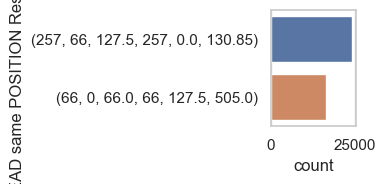


 +++++++++ unique 확인 / target 별 +++++++++
target                              AbNormal    Normal
HEAD same POSITION Result_Dam                         
(66, 0, 66.0, 66, 127.5, 505.0)     0.513191  0.399439
(257, 66, 127.5, 257, 0.0, 130.85)  0.486809  0.600561


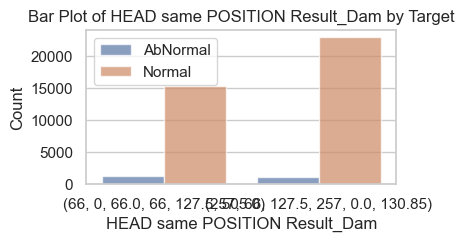

In [70]:
data_ana(DA_data, 'HEAD same POSITION Result_Dam')

+++++++++ unique 확인 +++++++++
66.00     24059
133.50     8231
130.85     7885
124.50      331
Name: Head Clean Position Z Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


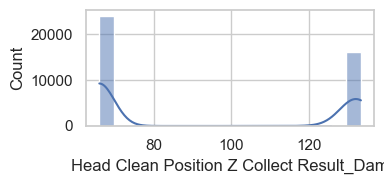


 +++++++++ unique 확인 / target 별 +++++++++
target                                    AbNormal    Normal
Head Clean Position Z Collect Result_Dam                    
66.00                                     0.486809  0.600561
124.50                                    0.011915  0.007941
130.85                                    0.188936  0.195015
133.50                                    0.312340  0.196483


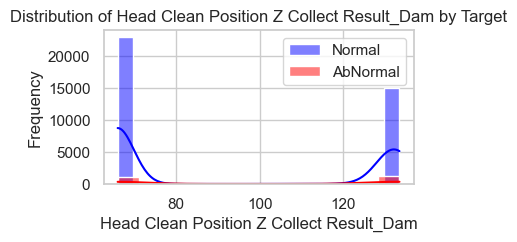

In [71]:
data_ana(DA_data, 'Head Clean Position Z Collect Result_Dam')

+++++++++ unique 확인 +++++++++
257.000    16447
282.150     5688
274.330     2855
274.510     2841
282.500     1999
282.343     1984
282.361     1441
280.894     1261
281.095     1211
274.200      847
274.400      802
281.430      408
281.517      408
273.800      406
281.413      399
274.000      394
274.780      381
281.324      334
281.226      148
281.222      132
281.300       55
281.513       36
281.424       29
Name: HEAD Standby Position X Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


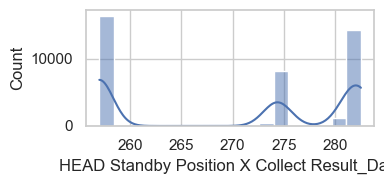


 +++++++++ unique 확인 / target 별 +++++++++
target                                      AbNormal    Normal
HEAD Standby Position X Collect Result_Dam                    
257.000                                     0.513191  0.399439
273.800                                     0.008085  0.010143
274.000                                     0.010638  0.009671
274.200                                     0.014043  0.021333
274.330                                     0.067234  0.070684
274.400                                     0.011915  0.020285
274.510                                     0.052340  0.071234
274.780                                     0.007234  0.009540
280.894                                     0.028085  0.031319
281.095                                     0.025957  0.030139
281.222                                     0.005957  0.003093
281.226                                     0.002128  0.003748
281.300                                     0.000851  0.001389
281.324     

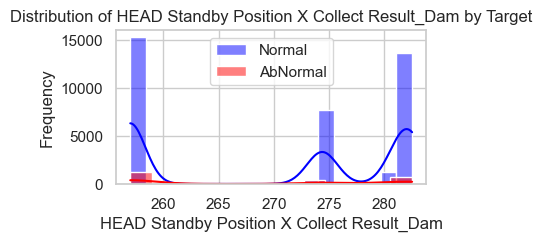

In [72]:
data_ana(DA_data, 'HEAD Standby Position X Collect Result_Dam')

+++++++++ unique 확인 +++++++++
257.00    16447
130.85    15533
124.00     8493
118.85       33
Name: Head Purge Position X Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


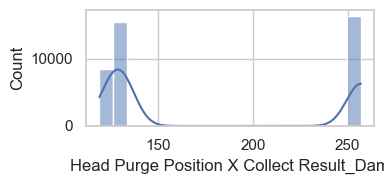


 +++++++++ unique 확인 / target 별 +++++++++
target                                    AbNormal    Normal
Head Purge Position X Collect Result_Dam                    
118.85                                    0.000000  0.000865
124.00                                    0.171489  0.212024
130.85                                    0.315319  0.387672
257.00                                    0.513191  0.399439


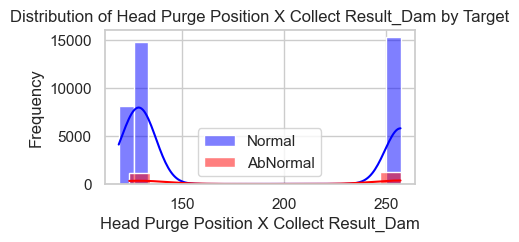

In [73]:
data_ana(DA_data, 'Head Purge Position X Collect Result_Dam')

+++++++++ unique 확인 +++++++++
66.00     24059
133.50     8246
130.85     7870
124.50      331
Name: Head Purge Position Z Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


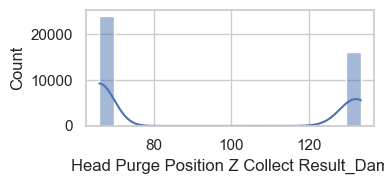


 +++++++++ unique 확인 / target 별 +++++++++
target                                    AbNormal    Normal
Head Purge Position Z Collect Result_Dam                    
66.00                                     0.486809  0.600561
124.50                                    0.011915  0.007941
130.85                                    0.188085  0.194674
133.50                                    0.313191  0.196824


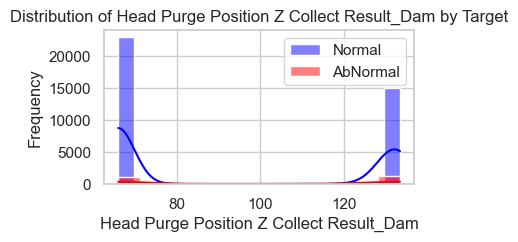

In [74]:
data_ana(DA_data, 'Head Purge Position Z Collect Result_Dam')

+++++++++ unique 확인 +++++++++
505.0    24059
300.0    11754
303.5     4693
Name: Head Zero Position Y Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


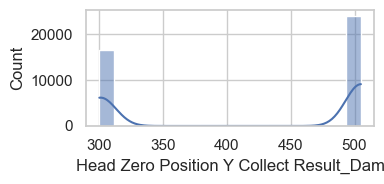


 +++++++++ unique 확인 / target 별 +++++++++
target                                   AbNormal    Normal
Head Zero Position Y Collect Result_Dam                    
300.0                                    0.326383  0.287949
303.5                                    0.186809  0.111490
505.0                                    0.486809  0.600561


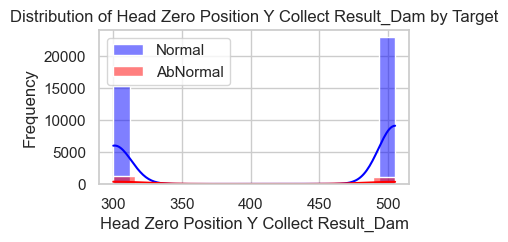

In [75]:
data_ana(DA_data, 'Head Zero Position Y Collect Result_Dam')

+++++++++ unique 확인 +++++++++
300.0    23995
265.0    16447
303.5       64
Name: Head Zero Position Z Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


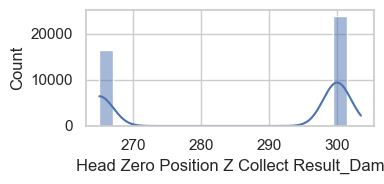


 +++++++++ unique 확인 / target 별 +++++++++
target                                   AbNormal    Normal
Head Zero Position Z Collect Result_Dam                    
265.0                                    0.513191  0.399439
300.0                                    0.468511  0.600010
303.5                                    0.018298  0.000550


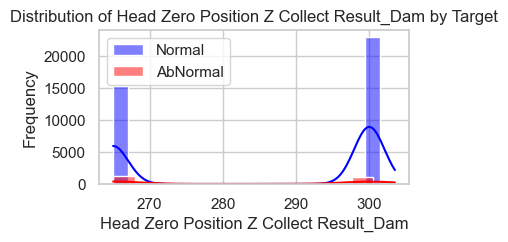

In [76]:
data_ana(DA_data, 'Head Zero Position Z Collect Result_Dam')

유난히 Head 변수들이 불량, 정상간의 차이가 비교적 큼

+++++++++ unique 확인 +++++++++
265.02    15247
265.00     8812
92.20      1580
88.30      1291
88.40      1240
          ...  
92.50         1
78.60         1
35.50         1
157.20        1
99.60         1
Name: Machine Tact time Collect Result_Dam, Length: 266, dtype: int64

 +++++++++ 시각화 +++++++++


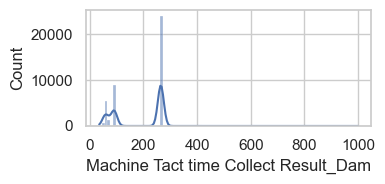


 +++++++++ unique 확인 / target 별 +++++++++
target                                AbNormal    Normal
Machine Tact time Collect Result_Dam                    
35.50                                 0.000000  0.000026
35.60                                 0.000000  0.000026
40.60                                 0.000000  0.000026
47.50                                 0.000000  0.000026
47.60                                 0.000000  0.000026
...                                        ...       ...
265.00                                0.172340  0.220332
265.02                                0.314468  0.380229
283.70                                0.000000  0.000026
523.00                                0.000000  0.000026
999.90                                0.000426  0.000000

[266 rows x 2 columns]


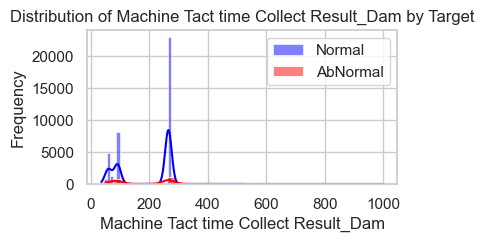

In [77]:
data_ana(DA_data, 'Machine Tact time Collect Result_Dam')

Machine tact time의 경우 999.90은 무조건 불량. 오류 예상

+++++++++ unique 확인 +++++++++
4.0      1656
1.0      1626
3.0      1625
2.0      1620
7.0      1599
         ... 
111.7       1
362.3       1
95.7        1
79.8        1
110.5       1
Name: PalletID Collect Result_Dam, Length: 374, dtype: int64

 +++++++++ 시각화 +++++++++


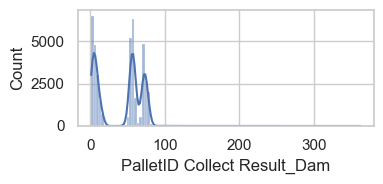


 +++++++++ unique 확인 / target 별 +++++++++
target                       AbNormal    Normal
PalletID Collect Result_Dam                    
1.0                          0.049362  0.039574
2.0                          0.054043  0.039129
3.0                          0.055745  0.039155
4.0                          0.049787  0.040334
5.0                          0.049362  0.038605
...                               ...       ...
212.9                        0.000000  0.000026
239.9                        0.000426  0.000000
243.1                        0.000426  0.000000
276.6                        0.000000  0.000026
362.3                        0.000000  0.000026

[374 rows x 2 columns]


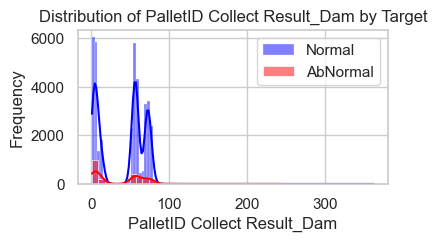

In [78]:
data_ana(DA_data, 'PalletID Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6      1608
16     1604
3      1599
12     1581
8      1574
       ... 
460       1
483       1
480       1
485       1
472       1
Name: Production Qty Collect Result_Dam, Length: 486, dtype: int64

 +++++++++ 시각화 +++++++++


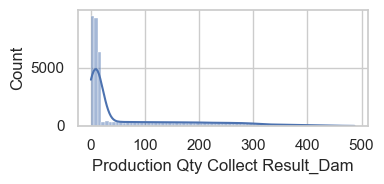


 +++++++++ unique 확인 / target 별 +++++++++
target                             AbNormal    Normal
Production Qty Collect Result_Dam                    
0                                  0.002553  0.000839
1                                  0.026809  0.039548
2                                  0.037872  0.038500
3                                  0.036170  0.039679
4                                  0.025532  0.039601
...                                     ...       ...
481                                0.000000  0.000052
482                                0.000000  0.000026
483                                0.000000  0.000026
485                                0.000426  0.000000
487                                0.000426  0.000000

[486 rows x 2 columns]


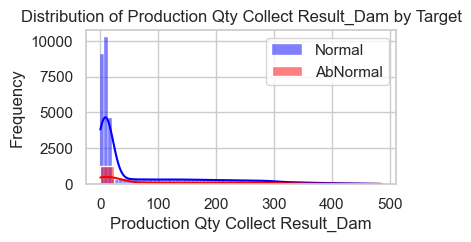

In [79]:
data_ana(DA_data, 'Production Qty Collect Result_Dam')

+++++++++ unique 확인 +++++++++
1      16511
14        90
33        88
30        85
44        85
       ...  
596        1
583        1
608        1
544        1
576        1
Name: Receip No Collect Result_Dam, Length: 607, dtype: int64

 +++++++++ 시각화 +++++++++


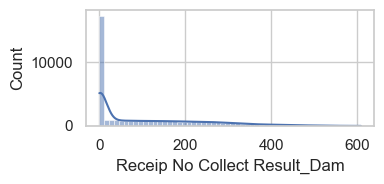


 +++++++++ unique 확인 / target 별 +++++++++
target                        AbNormal    Normal
Receip No Collect Result_Dam                    
0                             0.004681  0.001232
1                             0.516170  0.400933
2                             0.001702  0.001704
3                             0.001702  0.001756
4                             0.001702  0.001677
...                                ...       ...
604                           0.000000  0.000026
605                           0.000000  0.000026
606                           0.000000  0.000026
607                           0.000000  0.000026
608                           0.000000  0.000026

[607 rows x 2 columns]


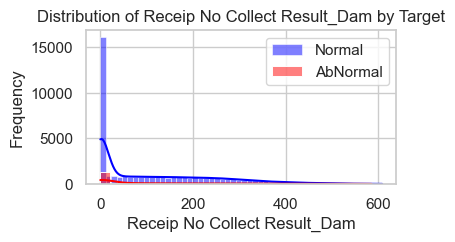

In [80]:
data_ana(DA_data, 'Receip No Collect Result_Dam')

+++++++++ unique 확인 +++++++++
1       22833
9000    10007
5000     4901
4000     1539
6         980
9          96
17         86
3          64
Name: Stage1 Circle1 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


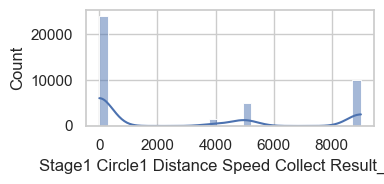


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage1 Circle1 Distance Speed Collect Result_Dam                    
1                                                 0.431064  0.571863
3                                                 0.018298  0.000550
6                                                 0.034894  0.023535
9                                                 0.000426  0.002490
17                                                0.002128  0.002123
4000                                              0.023830  0.038867
5000                                              0.129787  0.120453
9000                                              0.359574  0.240120


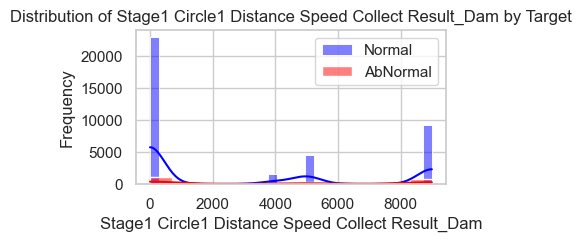

In [81]:
data_ana(DA_data, 'Stage1 Circle1 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6500    12539
9000    10007
4000     6138
5800     5295
5000     4901
6000     1342
6200      284
Name: Stage1 Circle2 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


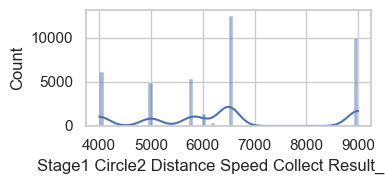


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage1 Circle2 Distance Speed Collect Result_Dam                    
4000                                              0.108936  0.154157
5000                                              0.129787  0.120453
5800                                              0.114468  0.131722
6000                                              0.027660  0.033468
6200                                              0.006383  0.007050
6500                                              0.253191  0.313031
9000                                              0.359574  0.240120


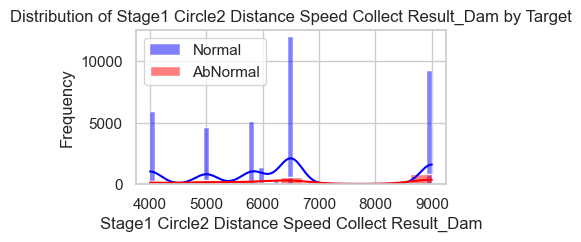

In [82]:
data_ana(DA_data, 'Stage1 Circle2 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6500    12539
9000    10007
4000     6138
5800     5295
5000     4901
6000     1342
6200      284
Name: Stage1 Circle3 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


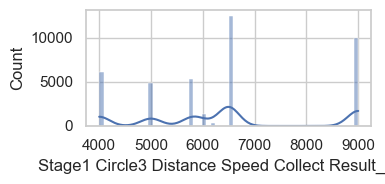


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage1 Circle3 Distance Speed Collect Result_Dam                    
4000                                              0.108936  0.154157
5000                                              0.129787  0.120453
5800                                              0.114468  0.131722
6000                                              0.027660  0.033468
6200                                              0.006383  0.007050
6500                                              0.253191  0.313031
9000                                              0.359574  0.240120


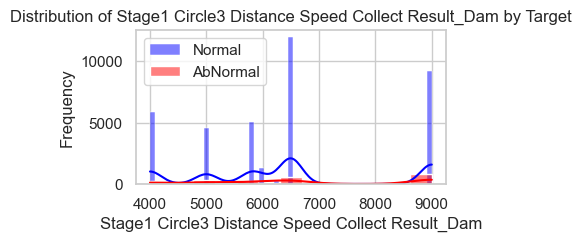

In [83]:
data_ana(DA_data, 'Stage1 Circle3 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6500    12539
9000    10007
4000     6138
5800     5295
5000     4901
6000     1342
6200      284
Name: Stage1 Circle4 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


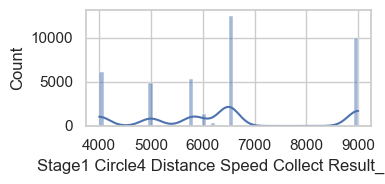


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage1 Circle4 Distance Speed Collect Result_Dam                    
4000                                              0.108936  0.154157
5000                                              0.129787  0.120453
5800                                              0.114468  0.131722
6000                                              0.027660  0.033468
6200                                              0.006383  0.007050
6500                                              0.253191  0.313031
9000                                              0.359574  0.240120


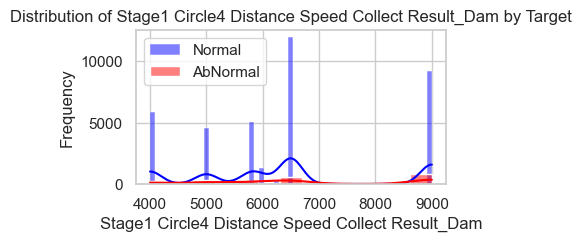

In [84]:
data_ana(DA_data, 'Stage1 Circle4 Distance Speed Collect Result_Dam')

Circle 1을 제외한 2,3,4는 분포가 동일

In [116]:
DA_data['Stage1 Circle 2,3,4 Distance Speed Result_Dam'] = DA_data.apply(lambda row: (row['Stage1 Circle2 Distance Speed Collect Result_Dam'],
                                                           row['Stage1 Circle3 Distance Speed Collect Result_Dam'],
                                                            row['Stage1 Circle4 Distance Speed Collect Result_Dam']), axis=1)
DA_data = DA_data.drop(['Stage1 Circle2 Distance Speed Collect Result_Dam',
                       'Stage1 Circle3 Distance Speed Collect Result_Dam',
                        'Stage1 Circle4 Distance Speed Collect Result_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
(6500, 6500, 6500)    12539
(9000, 9000, 9000)    10007
(4000, 4000, 4000)     6138
(5800, 5800, 5800)     5295
(5000, 5000, 5000)     4901
(6000, 6000, 6000)     1342
(6200, 6200, 6200)      284
Name: Stage1 Circle 2,3,4 Distance Speed Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


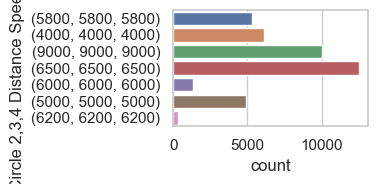


 +++++++++ unique 확인 / target 별 +++++++++
target                                         AbNormal    Normal
Stage1 Circle 2,3,4 Distance Speed Result_Dam                    
(4000, 4000, 4000)                             0.108936  0.154157
(5000, 5000, 5000)                             0.129787  0.120453
(5800, 5800, 5800)                             0.114468  0.131722
(6000, 6000, 6000)                             0.027660  0.033468
(6200, 6200, 6200)                             0.006383  0.007050
(6500, 6500, 6500)                             0.253191  0.313031
(9000, 9000, 9000)                             0.359574  0.240120


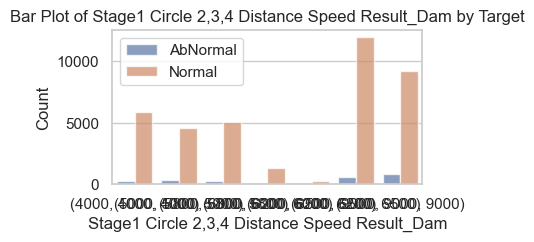

In [86]:
data_ana(DA_data, 'Stage1 Circle 2,3,4 Distance Speed Result_Dam')

+++++++++ unique 확인 +++++++++
6500     12539
9000     11823
5800      5295
4000      4599
12000     3424
6000      1342
5000      1200
6200       284
Name: Stage2 Circle1 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


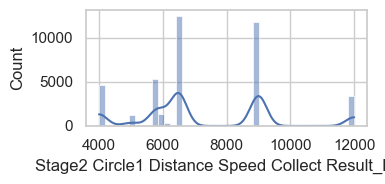


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage2 Circle1 Distance Speed Collect Result_Dam                    
4000                                              0.085106  0.115290
5000                                              0.020851  0.030166
5800                                              0.114468  0.131722
6000                                              0.027660  0.033468
6200                                              0.006383  0.007050
6500                                              0.253191  0.313031
9000                                              0.365957  0.287320
12000                                             0.126383  0.081953


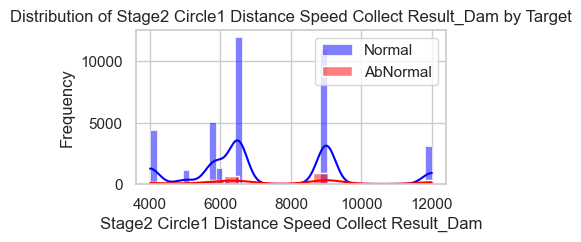

In [87]:
data_ana(DA_data, 'Stage2 Circle1 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
9000     11823
6500      8033
5500      6051
5300      5295
4000      4008
12000     3469
5000      1351
8000       440
6000        36
Name: Stage2 Circle2 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


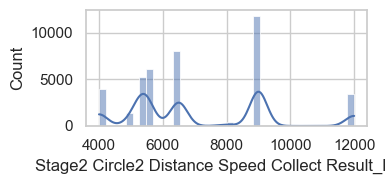


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage2 Circle2 Distance Speed Collect Result_Dam                    
4000                                              0.069787  0.100744
5000                                              0.024255  0.033913
5300                                              0.114468  0.131722
5500                                              0.099574  0.152453
6000                                              0.001277  0.000865
6500                                              0.185106  0.199130
8000                                              0.011915  0.010798
9000                                              0.365957  0.287320
12000                                             0.127660  0.083054


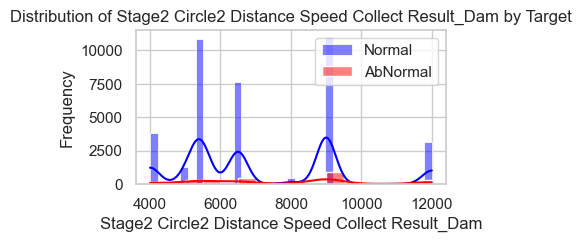

In [88]:
data_ana(DA_data, 'Stage2 Circle2 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
9000     11823
6500      8033
5500      6051
5300      5295
4000      4008
12000     3469
5000      1351
8000       440
6000        36
Name: Stage2 Circle3 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


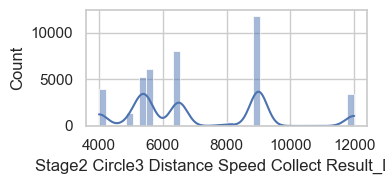


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage2 Circle3 Distance Speed Collect Result_Dam                    
4000                                              0.069787  0.100744
5000                                              0.024255  0.033913
5300                                              0.114468  0.131722
5500                                              0.099574  0.152453
6000                                              0.001277  0.000865
6500                                              0.185106  0.199130
8000                                              0.011915  0.010798
9000                                              0.365957  0.287320
12000                                             0.127660  0.083054


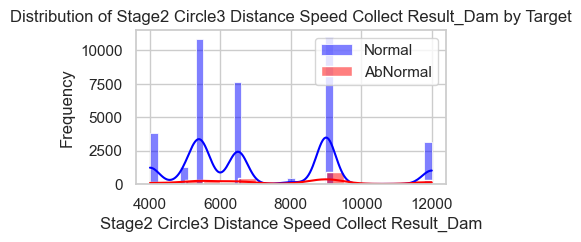

In [89]:
data_ana(DA_data, 'Stage2 Circle3 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
9000     11823
6500      8033
5500      6051
5300      5295
4000      4008
12000     3469
5000      1351
8000       440
6000        36
Name: Stage2 Circle4 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


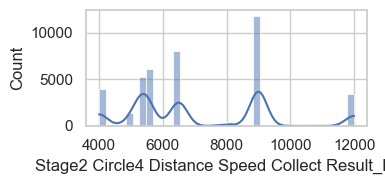


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage2 Circle4 Distance Speed Collect Result_Dam                    
4000                                              0.069787  0.100744
5000                                              0.024255  0.033913
5300                                              0.114468  0.131722
5500                                              0.099574  0.152453
6000                                              0.001277  0.000865
6500                                              0.185106  0.199130
8000                                              0.011915  0.010798
9000                                              0.365957  0.287320
12000                                             0.127660  0.083054


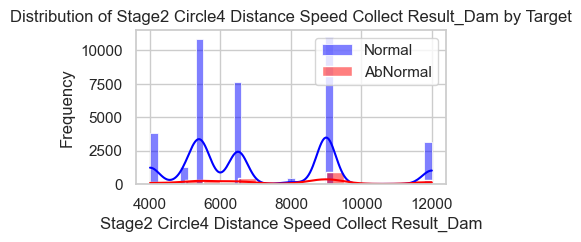

In [90]:
data_ana(DA_data, 'Stage2 Circle4 Distance Speed Collect Result_Dam')

In [117]:
DA_data['Stage2 Circle 3,4 Distance Speed Result_Dam'] = DA_data.apply(lambda row: (row['Stage2 Circle3 Distance Speed Collect Result_Dam'],
                                                            row['Stage2 Circle4 Distance Speed Collect Result_Dam']), axis=1)
DA_data = DA_data.drop(['Stage2 Circle3 Distance Speed Collect Result_Dam',
                        'Stage2 Circle4 Distance Speed Collect Result_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
(9000, 9000)      11823
(6500, 6500)       8033
(5500, 5500)       6051
(5300, 5300)       5295
(4000, 4000)       4008
(12000, 12000)     3469
(5000, 5000)       1351
(8000, 8000)        440
(6000, 6000)         36
Name: Stage2 Circle 3,4 Distance Speed Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


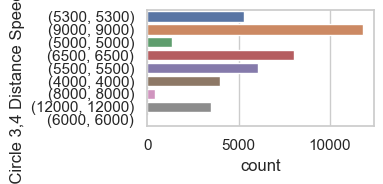


 +++++++++ unique 확인 / target 별 +++++++++
target                                       AbNormal    Normal
Stage2 Circle 3,4 Distance Speed Result_Dam                    
(4000, 4000)                                 0.069787  0.100744
(5000, 5000)                                 0.024255  0.033913
(5300, 5300)                                 0.114468  0.131722
(5500, 5500)                                 0.099574  0.152453
(6000, 6000)                                 0.001277  0.000865
(6500, 6500)                                 0.185106  0.199130
(8000, 8000)                                 0.011915  0.010798
(9000, 9000)                                 0.365957  0.287320
(12000, 12000)                               0.127660  0.083054


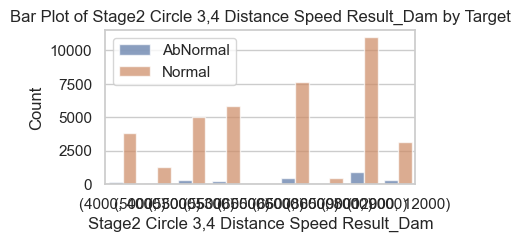

In [92]:
data_ana(DA_data, 'Stage2 Circle 3,4 Distance Speed Result_Dam')

+++++++++ unique 확인 +++++++++
9000     10007
6500      8033
5500      6024
4000      5547
5300      5295
5000      5052
8000       440
12000       45
6000        36
5800        27
Name: Stage3 Circle1 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


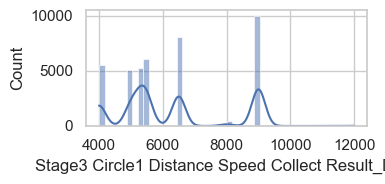


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage3 Circle1 Distance Speed Collect Result_Dam                    
4000                                              0.093617  0.139611
5000                                              0.133191  0.124201
5300                                              0.114468  0.131722
5500                                              0.096170  0.151955
5800                                              0.003404  0.000498
6000                                              0.001277  0.000865
6500                                              0.185106  0.199130
8000                                              0.011915  0.010798
9000                                              0.359574  0.240120
12000                                             0.001277  0.001101


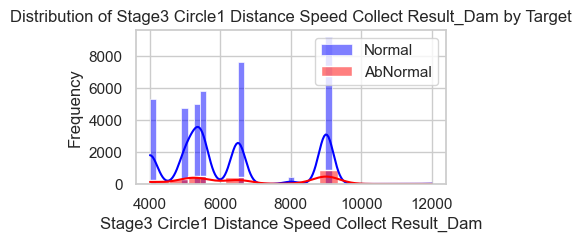

In [93]:
data_ana(DA_data, 'Stage3 Circle1 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6500    12458
9000    10007
4000     6138
5800     5295
5000     4901
6000     1423
6200      284
Name: Stage3 Circle2 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


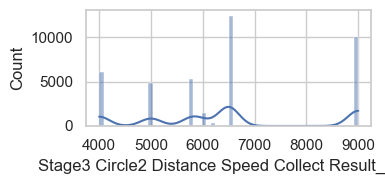


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage3 Circle2 Distance Speed Collect Result_Dam                    
4000                                              0.108936  0.154157
5000                                              0.129787  0.120453
5800                                              0.114468  0.131722
6000                                              0.029787  0.035460
6200                                              0.006383  0.007050
6500                                              0.251064  0.311039
9000                                              0.359574  0.240120


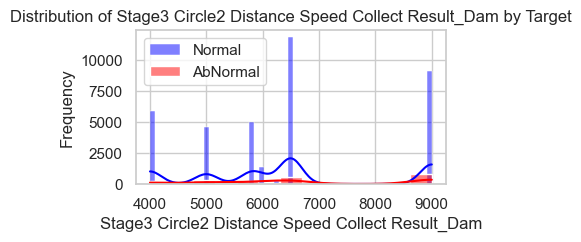

In [94]:
data_ana(DA_data, 'Stage3 Circle2 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6500    12458
9000    10007
4000     6138
5800     5295
5000     4901
6000     1423
6200      284
Name: Stage3 Circle3 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


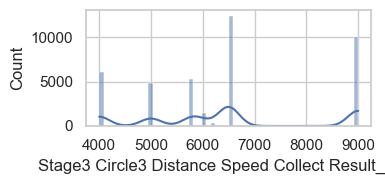


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage3 Circle3 Distance Speed Collect Result_Dam                    
4000                                              0.108936  0.154157
5000                                              0.129787  0.120453
5800                                              0.114468  0.131722
6000                                              0.029787  0.035460
6200                                              0.006383  0.007050
6500                                              0.251064  0.311039
9000                                              0.359574  0.240120


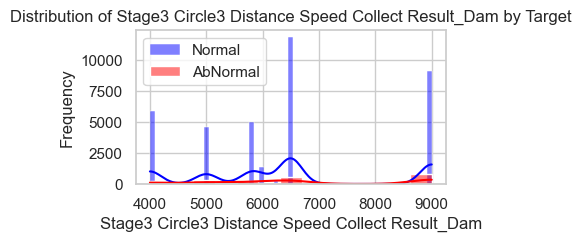

In [95]:
data_ana(DA_data, 'Stage3 Circle3 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6500    12458
9000    10007
4000     6138
5800     5295
5000     4901
6000     1423
6200      284
Name: Stage3 Circle4 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


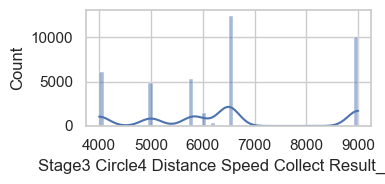


 +++++++++ unique 확인 / target 별 +++++++++
target                                            AbNormal    Normal
Stage3 Circle4 Distance Speed Collect Result_Dam                    
4000                                              0.108936  0.154157
5000                                              0.129787  0.120453
5800                                              0.114468  0.131722
6000                                              0.029787  0.035460
6200                                              0.006383  0.007050
6500                                              0.251064  0.311039
9000                                              0.359574  0.240120


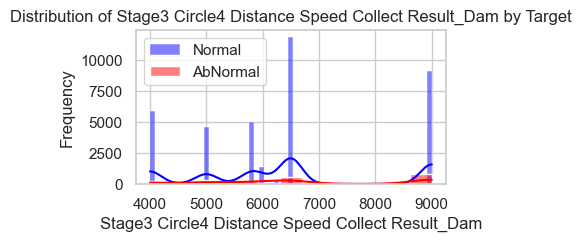

In [96]:
data_ana(DA_data, 'Stage3 Circle4 Distance Speed Collect Result_Dam')

In [118]:
DA_data['Stage3 Circle 2,3,4 Distance Speed Result_Dam'] = DA_data.apply(lambda row: (row['Stage3 Circle2 Distance Speed Collect Result_Dam'],
                                                           row['Stage3 Circle3 Distance Speed Collect Result_Dam'],
                                                            row['Stage3 Circle4 Distance Speed Collect Result_Dam']), axis=1)
DA_data = DA_data.drop(['Stage3 Circle2 Distance Speed Collect Result_Dam',
                       'Stage3 Circle3 Distance Speed Collect Result_Dam',
                        'Stage3 Circle4 Distance Speed Collect Result_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
(6500, 6500, 6500)    12458
(9000, 9000, 9000)    10007
(4000, 4000, 4000)     6138
(5800, 5800, 5800)     5295
(5000, 5000, 5000)     4901
(6000, 6000, 6000)     1423
(6200, 6200, 6200)      284
Name: Stage3 Circle 2,3,4 Distance Speed Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


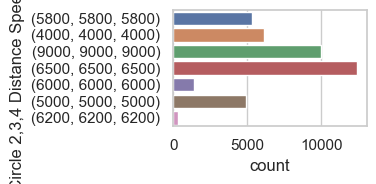


 +++++++++ unique 확인 / target 별 +++++++++
target                                         AbNormal    Normal
Stage3 Circle 2,3,4 Distance Speed Result_Dam                    
(4000, 4000, 4000)                             0.108936  0.154157
(5000, 5000, 5000)                             0.129787  0.120453
(5800, 5800, 5800)                             0.114468  0.131722
(6000, 6000, 6000)                             0.029787  0.035460
(6200, 6200, 6200)                             0.006383  0.007050
(6500, 6500, 6500)                             0.251064  0.311039
(9000, 9000, 9000)                             0.359574  0.240120


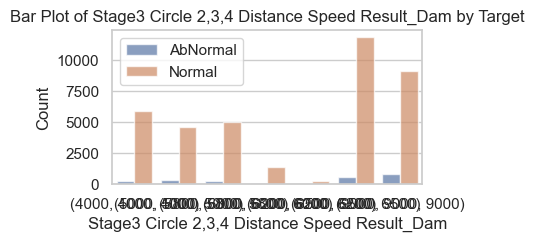

In [98]:
data_ana(DA_data, 'Stage3 Circle 2,3,4 Distance Speed Result_Dam')

+++++++++ unique 확인 +++++++++
6500    12539
9000     9901
4000     6138
5800     5295
5000     4901
6000     1342
6200      284
7000      106
Name: Stage1 Line1 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


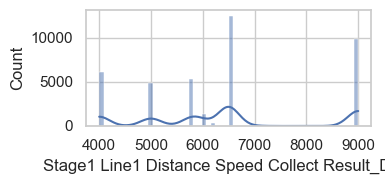


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage1 Line1 Distance Speed Collect Result_Dam                    
4000                                            0.108936  0.154157
5000                                            0.129787  0.120453
5800                                            0.114468  0.131722
6000                                            0.027660  0.033468
6200                                            0.006383  0.007050
6500                                            0.253191  0.313031
7000                                            0.005106  0.002464
9000                                            0.354468  0.237656


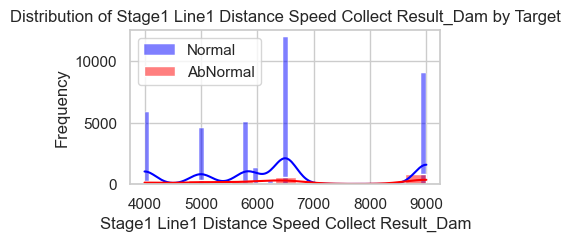

In [99]:
data_ana(DA_data, 'Stage1 Line1 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6500     12336
9000     10007
4000      6138
5800      5295
5000      4901
6000      1544
6200       284
13000        1
Name: Stage1 Line2 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


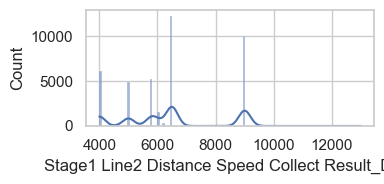


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage1 Line2 Distance Speed Collect Result_Dam                    
4000                                            0.108936  0.154157
5000                                            0.129787  0.120453
5800                                            0.114468  0.131722
6000                                            0.029787  0.038631
6200                                            0.006383  0.007050
6500                                            0.251064  0.307841
9000                                            0.359574  0.240120
13000                                           0.000000  0.000026


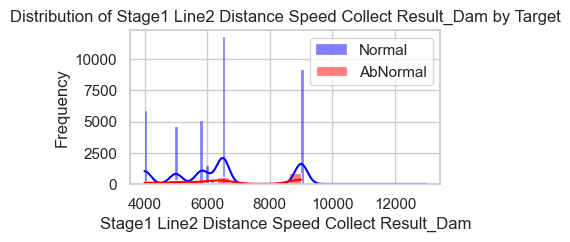

In [100]:
data_ana(DA_data, 'Stage1 Line2 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6500    12539
9000     9901
4000     6138
5800     5295
5000     4901
6000     1342
6200      284
7000      106
Name: Stage1 Line3 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


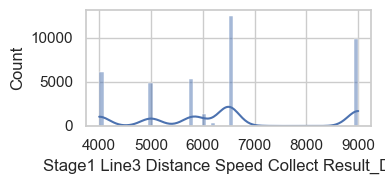


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage1 Line3 Distance Speed Collect Result_Dam                    
4000                                            0.108936  0.154157
5000                                            0.129787  0.120453
5800                                            0.114468  0.131722
6000                                            0.027660  0.033468
6200                                            0.006383  0.007050
6500                                            0.253191  0.313031
7000                                            0.005106  0.002464
9000                                            0.354468  0.237656


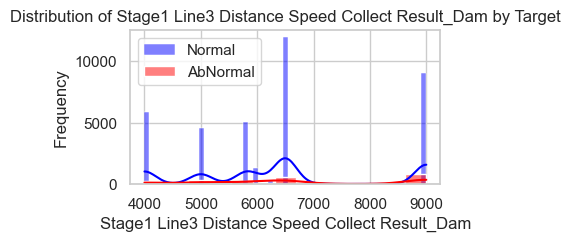

In [101]:
data_ana(DA_data, 'Stage1 Line3 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6500    12245
9000    10007
4000     6138
5000     4901
5600     3999
6000     1636
5800     1296
6200      284
Name: Stage1 Line4 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


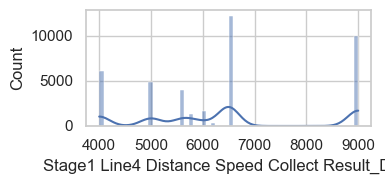


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage1 Line4 Distance Speed Collect Result_Dam                    
4000                                            0.108936  0.154157
5000                                            0.129787  0.120453
5600                                            0.096596  0.098857
5800                                            0.017872  0.032865
6000                                            0.029362  0.041068
6200                                            0.006383  0.007050
6500                                            0.251489  0.305430
9000                                            0.359574  0.240120


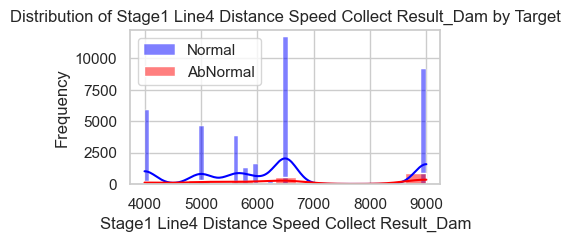

In [102]:
data_ana(DA_data, 'Stage1 Line4 Distance Speed Collect Result_Dam')

In [119]:
DA_data['Stage1 Line 1,3 Distance Speed Result_Dam'] = DA_data.apply(lambda row: (row['Stage1 Line1 Distance Speed Collect Result_Dam'],
                                                           row['Stage1 Line3 Distance Speed Collect Result_Dam']), axis=1)
DA_data = DA_data.drop(['Stage1 Line1 Distance Speed Collect Result_Dam',
                       'Stage1 Line3 Distance Speed Collect Result_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
(6500, 6500)    12539
(9000, 9000)     9901
(4000, 4000)     6138
(5800, 5800)     5295
(5000, 5000)     4901
(6000, 6000)     1342
(6200, 6200)      284
(7000, 7000)      106
Name: Stage1 Line 1,3 Distance Speed Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


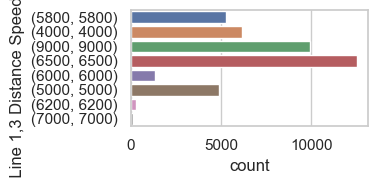


 +++++++++ unique 확인 / target 별 +++++++++
target                                     AbNormal    Normal
Stage1 Line 1,3 Distance Speed Result_Dam                    
(4000, 4000)                               0.108936  0.154157
(5000, 5000)                               0.129787  0.120453
(5800, 5800)                               0.114468  0.131722
(6000, 6000)                               0.027660  0.033468
(6200, 6200)                               0.006383  0.007050
(6500, 6500)                               0.253191  0.313031
(7000, 7000)                               0.005106  0.002464
(9000, 9000)                               0.354468  0.237656


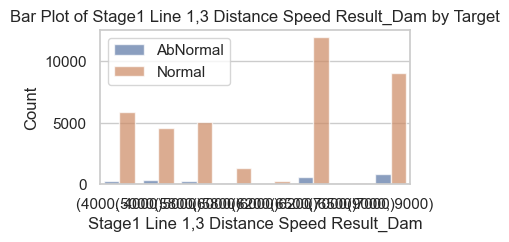

In [104]:
data_ana(DA_data, 'Stage1 Line 1,3 Distance Speed Result_Dam')

+++++++++ unique 확인 +++++++++
9000     11823
6500      8033
5500      6051
5300      5295
4000      4008
12000     3469
5000      1351
8000       440
6000        36
Name: Stage2 Line1 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


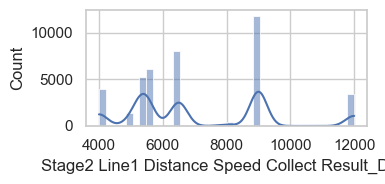


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage2 Line1 Distance Speed Collect Result_Dam                    
4000                                            0.069787  0.100744
5000                                            0.024255  0.033913
5300                                            0.114468  0.131722
5500                                            0.099574  0.152453
6000                                            0.001277  0.000865
6500                                            0.185106  0.199130
8000                                            0.011915  0.010798
9000                                            0.365957  0.287320
12000                                           0.127660  0.083054


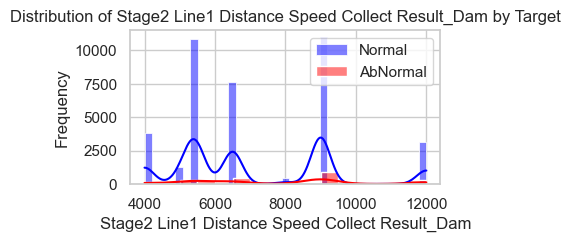

+++++++++ unique 확인 +++++++++
9000     11823
5500      8580
6500      5481
5300      5295
4000      4008
12000     3469
5000      1405
8000       440
13000        5
Name: Stage2 Line2 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


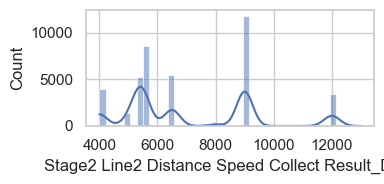


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage2 Line2 Distance Speed Collect Result_Dam                    
4000                                            0.069787  0.100744
5000                                            0.025532  0.035250
5300                                            0.114468  0.131722
5500                                            0.152766  0.215458
6500                                            0.131064  0.135575
8000                                            0.011915  0.010798
9000                                            0.365957  0.287320
12000                                           0.127660  0.083054
13000                                           0.000851  0.000079


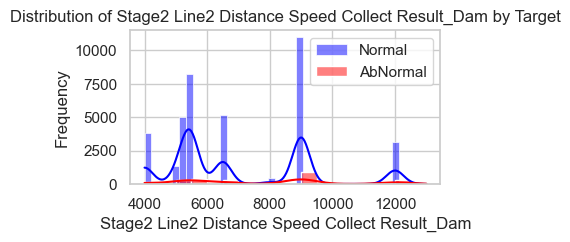

+++++++++ unique 확인 +++++++++
9000     11823
6500      8033
5500      6024
5300      5295
4000      4008
12000     3469
5000      1351
8000       440
6000        36
5800        27
Name: Stage2 Line3 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


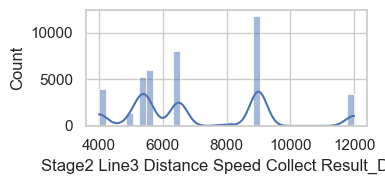


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage2 Line3 Distance Speed Collect Result_Dam                    
4000                                            0.069787  0.100744
5000                                            0.024255  0.033913
5300                                            0.114468  0.131722
5500                                            0.096170  0.151955
5800                                            0.003404  0.000498
6000                                            0.001277  0.000865
6500                                            0.185106  0.199130
8000                                            0.011915  0.010798
9000                                            0.365957  0.287320
12000                                           0.127660  0.083054


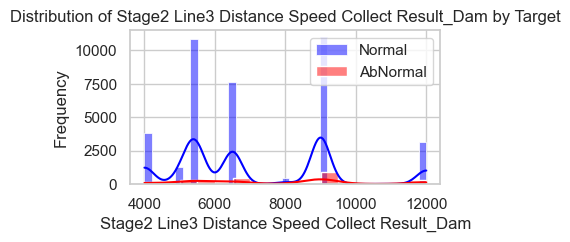

+++++++++ unique 확인 +++++++++
9000     11823
5500      8544
6500      5377
5300      5295
4000      4008
12000     3469
5000      1441
8000       440
6000       109
Name: Stage2 Line4 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


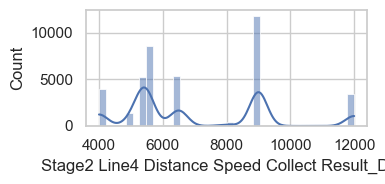


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage2 Line4 Distance Speed Collect Result_Dam                    
4000                                            0.069787  0.100744
5000                                            0.026809  0.036115
5300                                            0.114468  0.131722
5500                                            0.151489  0.214593
6000                                            0.001277  0.002778
6500                                            0.130638  0.132876
8000                                            0.011915  0.010798
9000                                            0.365957  0.287320
12000                                           0.127660  0.083054


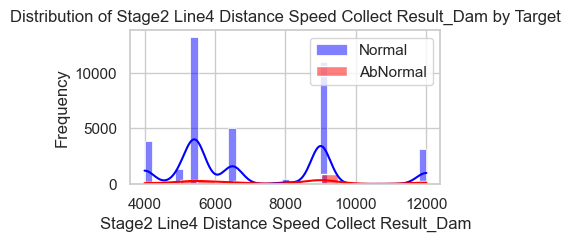

In [105]:
data_ana(DA_data, 'Stage2 Line1 Distance Speed Collect Result_Dam')
data_ana(DA_data, 'Stage2 Line2 Distance Speed Collect Result_Dam')
data_ana(DA_data, 'Stage2 Line3 Distance Speed Collect Result_Dam')
data_ana(DA_data, 'Stage2 Line4 Distance Speed Collect Result_Dam')

+++++++++ unique 확인 +++++++++
6500    12458
9000     9901
4000     6138
5800     5295
5000     4901
6000     1423
6200      284
7000      106
Name: Stage3 Line1 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


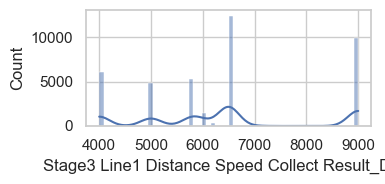


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage3 Line1 Distance Speed Collect Result_Dam                    
4000                                            0.108936  0.154157
5000                                            0.129787  0.120453
5800                                            0.114468  0.131722
6000                                            0.029787  0.035460
6200                                            0.006383  0.007050
6500                                            0.251064  0.311039
7000                                            0.005106  0.002464
9000                                            0.354468  0.237656


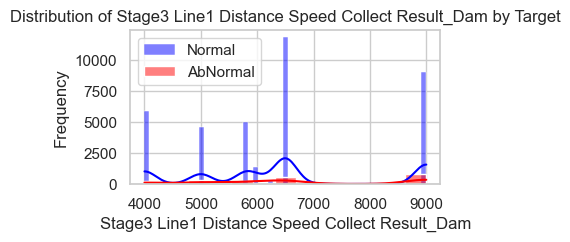

+++++++++ unique 확인 +++++++++
6500    12256
9000    10007
4000     6138
5800     5295
5000     4901
6000     1625
6200      284
Name: Stage3 Line2 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


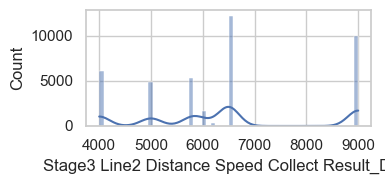


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage3 Line2 Distance Speed Collect Result_Dam                    
4000                                            0.108936  0.154157
5000                                            0.129787  0.120453
5800                                            0.114468  0.131722
6000                                            0.031915  0.040623
6200                                            0.006383  0.007050
6500                                            0.248936  0.305876
9000                                            0.359574  0.240120


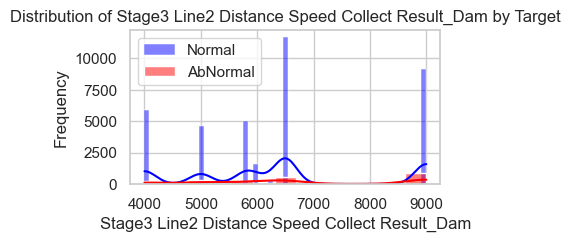

+++++++++ unique 확인 +++++++++
6500    12458
9000     9901
4000     6138
5800     5295
5000     4901
6000     1423
6200      284
7000      106
Name: Stage3 Line3 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


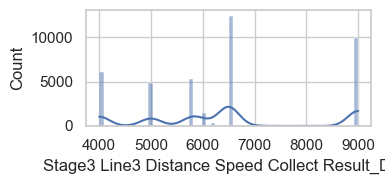


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage3 Line3 Distance Speed Collect Result_Dam                    
4000                                            0.108936  0.154157
5000                                            0.129787  0.120453
5800                                            0.114468  0.131722
6000                                            0.029787  0.035460
6200                                            0.006383  0.007050
6500                                            0.251064  0.311039
7000                                            0.005106  0.002464
9000                                            0.354468  0.237656


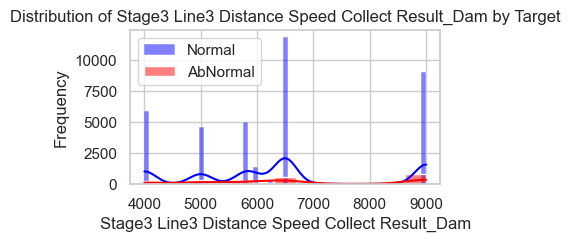

+++++++++ unique 확인 +++++++++
6500    12164
9000    10007
4000     6138
5800     5295
5000     4901
6000     1717
6200      284
Name: Stage3 Line4 Distance Speed Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


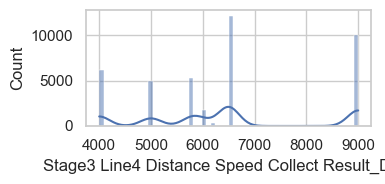


 +++++++++ unique 확인 / target 별 +++++++++
target                                          AbNormal    Normal
Stage3 Line4 Distance Speed Collect Result_Dam                    
4000                                            0.108936  0.154157
5000                                            0.129787  0.120453
5800                                            0.114468  0.131722
6000                                            0.031489  0.043060
6200                                            0.006383  0.007050
6500                                            0.249362  0.303439
9000                                            0.359574  0.240120


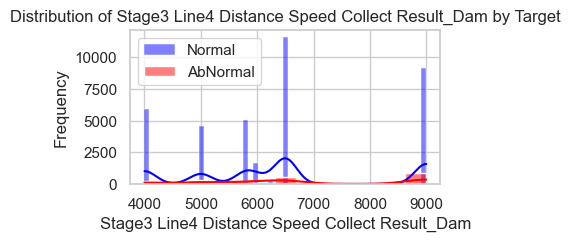

In [106]:
data_ana(DA_data, 'Stage3 Line1 Distance Speed Collect Result_Dam')
data_ana(DA_data, 'Stage3 Line2 Distance Speed Collect Result_Dam')
data_ana(DA_data, 'Stage3 Line3 Distance Speed Collect Result_Dam')
data_ana(DA_data, 'Stage3 Line4 Distance Speed Collect Result_Dam')

In [120]:
DA_data['Stage3 Line 1,3 Distance Speed Result_Dam'] = DA_data.apply(lambda row: (row['Stage3 Line1 Distance Speed Collect Result_Dam'],
                                                           row['Stage3 Line3 Distance Speed Collect Result_Dam']), axis=1)
DA_data = DA_data.drop(['Stage3 Line1 Distance Speed Collect Result_Dam',
                       'Stage3 Line3 Distance Speed Collect Result_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
(6500, 6500)    12458
(9000, 9000)     9901
(4000, 4000)     6138
(5800, 5800)     5295
(5000, 5000)     4901
(6000, 6000)     1423
(6200, 6200)      284
(7000, 7000)      106
Name: Stage3 Line 1,3 Distance Speed Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


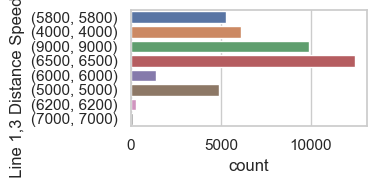


 +++++++++ unique 확인 / target 별 +++++++++
target                                     AbNormal    Normal
Stage3 Line 1,3 Distance Speed Result_Dam                    
(4000, 4000)                               0.108936  0.154157
(5000, 5000)                               0.129787  0.120453
(5800, 5800)                               0.114468  0.131722
(6000, 6000)                               0.029787  0.035460
(6200, 6200)                               0.006383  0.007050
(6500, 6500)                               0.251064  0.311039
(7000, 7000)                               0.005106  0.002464
(9000, 9000)                               0.354468  0.237656


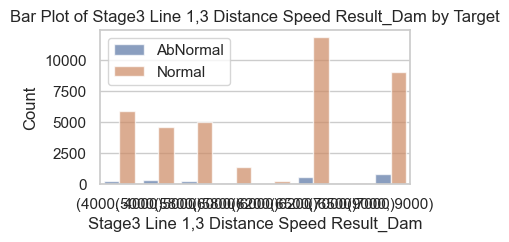

In [108]:
data_ana(DA_data, 'Stage3 Line 1,3 Distance Speed Result_Dam')

+++++++++ unique 확인 +++++++++
0       16447
6500    12458
5800     5295
4000     4599
6000     1423
6200      284
Name: THICKNESS 1 Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


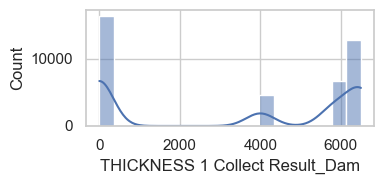


 +++++++++ unique 확인 / target 별 +++++++++
target                          AbNormal    Normal
THICKNESS 1 Collect Result_Dam                    
0                               0.513191  0.399439
4000                            0.085106  0.115290
5800                            0.114468  0.131722
6000                            0.029787  0.035460
6200                            0.006383  0.007050
6500                            0.251064  0.311039


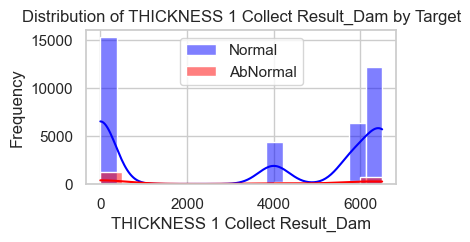

+++++++++ unique 확인 +++++++++
 0.000    35419
-0.019     1649
 0.014     1347
-0.015      964
-0.054      884
 0.012      125
 0.037      118
Name: THICKNESS 2 Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


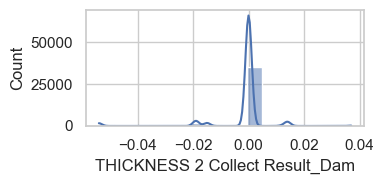


 +++++++++ unique 확인 / target 별 +++++++++
target                          AbNormal    Normal
THICKNESS 2 Collect Result_Dam                    
-0.054                          0.015745  0.022198
-0.019                          0.031489  0.041278
-0.015                          0.030638  0.023378
 0.000                          0.889787  0.873467
 0.012                          0.000851  0.003224
 0.014                          0.028936  0.033520
 0.037                          0.002553  0.002935


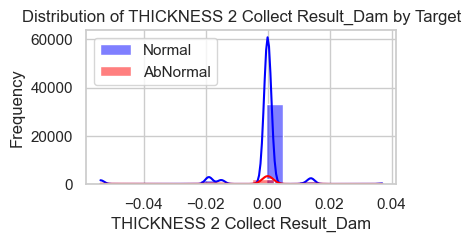

+++++++++ unique 확인 +++++++++
 0.000    35419
-0.021     1649
-0.058     1197
-0.036      964
-0.219      884
 0.007      150
-0.022      125
 0.005      118
Name: THICKNESS 3 Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


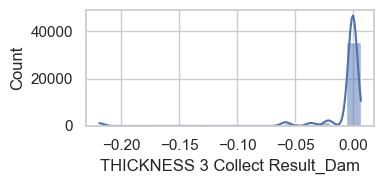


 +++++++++ unique 확인 / target 별 +++++++++
target                          AbNormal    Normal
THICKNESS 3 Collect Result_Dam                    
-0.219                          0.015745  0.022198
-0.058                          0.026383  0.029746
-0.036                          0.030638  0.023378
-0.022                          0.000851  0.003224
-0.021                          0.031489  0.041278
 0.000                          0.889787  0.873467
 0.005                          0.002553  0.002935
 0.007                          0.002553  0.003774


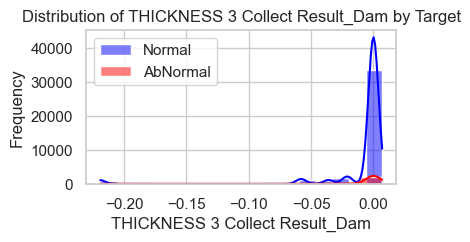

In [109]:
data_ana(DA_data, 'THICKNESS 1 Collect Result_Dam')
data_ana(DA_data, 'THICKNESS 2 Collect Result_Dam')
data_ana(DA_data, 'THICKNESS 3 Collect Result_Dam')

In [121]:
DA_data['THICKNESS 2,3 Result_Dam'] = DA_data.apply(lambda row: (row['THICKNESS 2 Collect Result_Dam'],
                                                            row['THICKNESS 3 Collect Result_Dam']), axis=1)
DA_data = DA_data.drop(['THICKNESS 2 Collect Result_Dam',
                       'THICKNESS 3 Collect Result_Dam'], axis=1)

+++++++++ unique 확인 +++++++++
 0.000    18972
 7.000    16447
-0.118     1649
 0.012     1347
-0.026      964
 0.007      884
 0.003      125
 0.024      118
Name: WorkMode Collect Result_Dam, dtype: int64

 +++++++++ 시각화 +++++++++


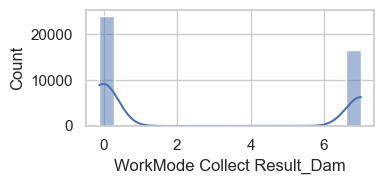


 +++++++++ unique 확인 / target 별 +++++++++
target                       AbNormal    Normal
WorkMode Collect Result_Dam                    
-0.118                       0.031489  0.041278
-0.026                       0.030638  0.023378
 0.000                       0.376596  0.474028
 0.003                       0.000851  0.003224
 0.007                       0.015745  0.022198
 0.012                       0.028936  0.033520
 0.024                       0.002553  0.002935
 7.000                       0.513191  0.399439


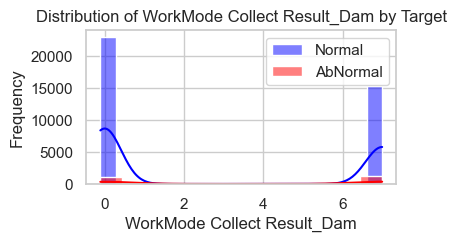

In [111]:
data_ana(DA_data, 'WorkMode Collect Result_Dam')

# AutoClave

+++++++++ unique 확인 +++++++++
AJX75334501    33820
AJX75334502     3390
AJX75334505     2635
AJX75334507      310
AJX75334503      162
AJX75334506      129
AJX75334508       60
Name: Model.Suffix_AutoClave, dtype: int64

 +++++++++ 시각화 +++++++++


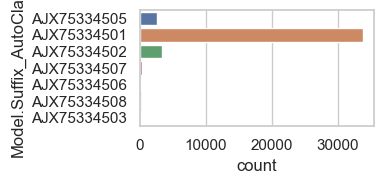


 +++++++++ unique 확인 / target 별 +++++++++
target                  AbNormal    Normal
Model.Suffix_AutoClave                    
AJX75334501             0.816170  0.836094
AJX75334502             0.097872  0.082818
AJX75334503             0.018723  0.003093
AJX75334505             0.055319  0.065652
AJX75334506             0.003404  0.003171
AJX75334507             0.007660  0.007653
AJX75334508             0.000851  0.001520


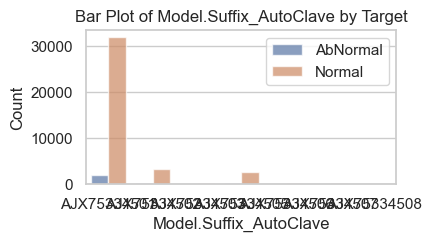

In [112]:
data_ana(DA_data, 'Model.Suffix_AutoClave')

+++++++++ unique 확인 +++++++++
3L1X8574-2       272
3K1XC268-1       227
3L1X9934-1       217
3L1X8506-1       217
3K1XA586-2       189
                ... 
4BPM0084-1         2
3FPXX064-0003      2
3H1XB714-1         1
4CPM0166-1         1
3HPM0061-1         1
Name: Workorder_AutoClave, Length: 663, dtype: int64

 +++++++++ 시각화 +++++++++


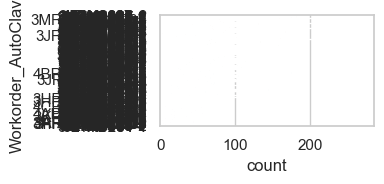


 +++++++++ unique 확인 / target 별 +++++++++
target               AbNormal    Normal
Workorder_AutoClave                    
3F1X5847-2           0.005106  0.002464
3F1X9643-1           0.002979  0.003669
3F1X9644-1           0.006809  0.003695
3F1X9648-1           0.004255  0.003931
3F1X9648-2           0.000426  0.000446
...                       ...       ...
4F1XB043-1           0.000426  0.000681
4F1XB596-1           0.001277  0.003695
4F1XB738-1           0.000000  0.000472
4F1XB758-1           0.000851  0.001966
4F1XB758-2           0.004255  0.000917

[663 rows x 2 columns]


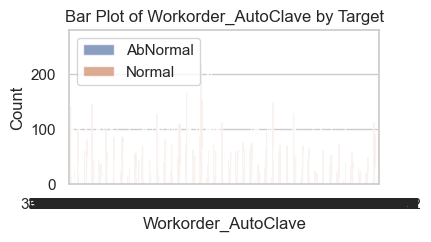

In [113]:
data_ana(DA_data, 'Workorder_AutoClave')

Dam과 같음

In [122]:
DA_data = DA_data.drop('Workorder_AutoClave', axis=1)
DA_data = DA_data.drop('Model.Suffix_AutoClave', axis=1)

+++++++++ unique 확인 +++++++++
0.311    2932
0.310    2723
0.301    2705
0.312    2631
0.309    2586
0.313    2423
0.302    2311
0.300    2308
0.308    2281
0.314    2275
0.303    2109
0.305    1934
0.299    1841
0.315    1801
0.304    1791
0.307    1491
0.306    1434
0.298    1212
0.316     891
0.297     334
0.317     333
0.318      83
0.296      39
0.319      15
0.292      12
0.290       8
0.295       3
Name: 1st Pressure Collect Result_AutoClave, dtype: int64

 +++++++++ 시각화 +++++++++


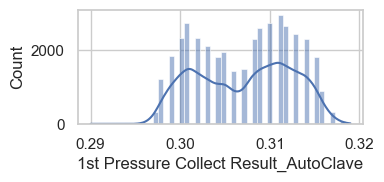


 +++++++++ unique 확인 / target 별 +++++++++
target                                 AbNormal    Normal
1st Pressure Collect Result_AutoClave                    
0.290                                  0.000000  0.000210
0.292                                  0.000000  0.000314
0.295                                  0.001277  0.000000
0.296                                  0.001277  0.000943
0.297                                  0.005957  0.008387
0.298                                  0.027660  0.030061
0.299                                  0.040000  0.045786
0.300                                  0.059149  0.056846
0.301                                  0.074894  0.066281
0.302                                  0.055319  0.057160
0.303                                  0.054043  0.051945
0.304                                  0.041277  0.044397
0.305                                  0.045106  0.047909
0.306                                  0.029787  0.035748
0.307                        

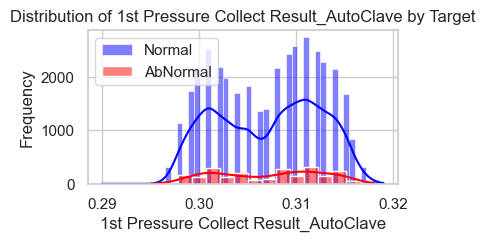

+++++++++ unique 확인 +++++++++
0.490    4957
0.491    4760
0.492    4122
0.312    1596
0.311    1507
         ... 
0.297       3
0.452       2
0.322       2
0.803       1
0.806       1
Name: 2nd Pressure Collect Result_AutoClave, Length: 67, dtype: int64

 +++++++++ 시각화 +++++++++


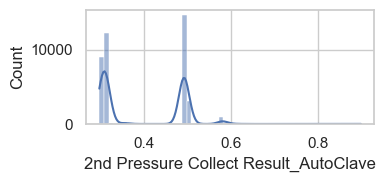


 +++++++++ unique 확인 / target 별 +++++++++
target                                 AbNormal    Normal
2nd Pressure Collect Result_AutoClave                    
0.297                                  0.000851  0.000026
0.298                                  0.002553  0.003433
0.299                                  0.010213  0.012423
0.300                                  0.020000  0.024714
0.301                                  0.036596  0.032839
...                                         ...       ...
0.621                                  0.000000  0.000288
0.715                                  0.000000  0.000131
0.803                                  0.000000  0.000026
0.806                                  0.000000  0.000026
0.900                                  0.000000  0.000629

[67 rows x 2 columns]


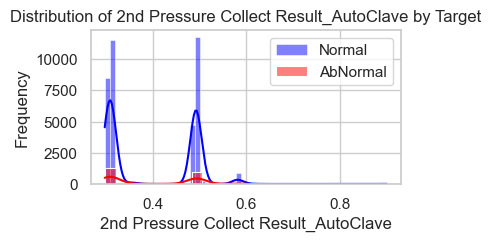

+++++++++ unique 확인 +++++++++
0.498    8592
0.499    8441
0.500    7942
0.497    6196
0.501    3873
         ... 
0.506       2
0.397       2
0.552       1
0.823       1
0.824       1
Name: 3rd Pressure Collect Result_AutoClave, Length: 67, dtype: int64

 +++++++++ 시각화 +++++++++


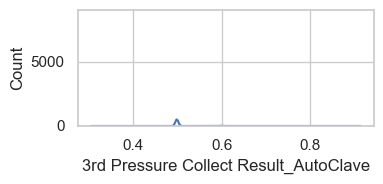


 +++++++++ unique 확인 / target 별 +++++++++
target                                 AbNormal    Normal
3rd Pressure Collect Result_AutoClave                    
0.305                                  0.000000  0.000577
0.312                                  0.001277  0.000079
0.315                                  0.000000  0.000105
0.349                                  0.000851  0.000446
0.350                                  0.000426  0.000341
...                                         ...       ...
0.698                                  0.000426  0.000026
0.761                                  0.000000  0.000131
0.823                                  0.000000  0.000026
0.824                                  0.000000  0.000026
0.914                                  0.000000  0.000629

[67 rows x 2 columns]


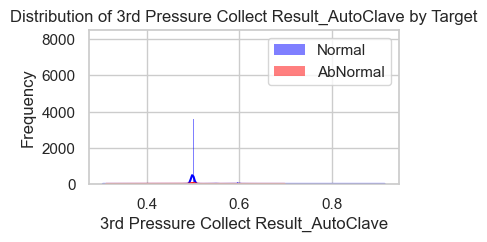

In [115]:
data_ana(DA_data, '1st Pressure Collect Result_AutoClave')
data_ana(DA_data, '2nd Pressure Collect Result_AutoClave')
data_ana(DA_data, '3rd Pressure Collect Result_AutoClave')

+++++++++ unique 확인 +++++++++
241    27788
240     8695
300     3606
181      224
180       66
61        47
0         32
1         30
60        18
Name: 1st Pressure 1st Pressure Unit Time_AutoClave, dtype: int64

 +++++++++ 시각화 +++++++++


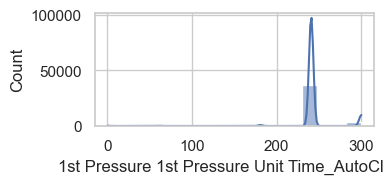


 +++++++++ unique 확인 / target 별 +++++++++
target                                         AbNormal    Normal
1st Pressure 1st Pressure Unit Time_AutoClave                    
0                                              0.002553  0.000681
1                                              0.000000  0.000786
60                                             0.004255  0.000210
61                                             0.011064  0.000550
180                                            0.005532  0.001389
181                                            0.003830  0.005635
240                                            0.240851  0.213046
241                                            0.595745  0.691582
300                                            0.136170  0.086120


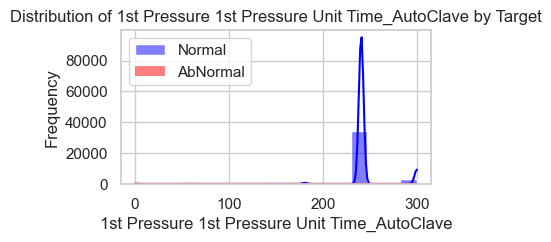

+++++++++ unique 확인 +++++++++
1      19182
121    10813
120     4777
60      3404
90      1954
0        177
150       82
61        69
181       45
180        3
Name: 2nd Pressure Unit Time_AutoClave, dtype: int64

 +++++++++ 시각화 +++++++++


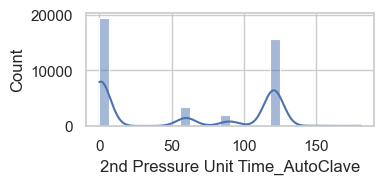


 +++++++++ unique 확인 / target 별 +++++++++
target                            AbNormal    Normal
2nd Pressure Unit Time_AutoClave                    
0                                 0.002979  0.004455
1                                 0.398298  0.478195
60                                0.128085  0.081324
61                                0.005532  0.001468
90                                0.034043  0.049114
120                               0.176596  0.114320
121                               0.249787  0.268005
150                               0.002553  0.001992
180                               0.000426  0.000052
181                               0.001702  0.001075


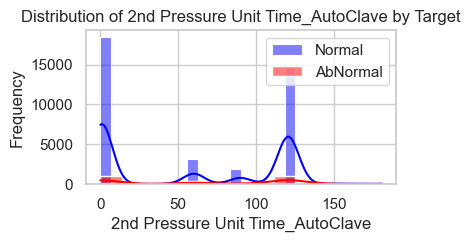

+++++++++ unique 확인 +++++++++
121    27091
120    11288
150     1613
181      240
90       103
180       61
60        54
61        37
1         10
241        8
301        1
Name: 3rd Pressure Unit Time_AutoClave, dtype: int64

 +++++++++ 시각화 +++++++++


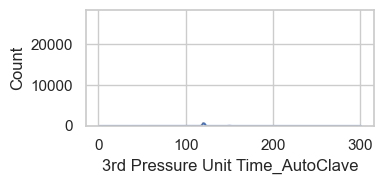


 +++++++++ unique 확인 / target 별 +++++++++
target                            AbNormal    Normal
3rd Pressure Unit Time_AutoClave                    
1                                 0.001277  0.000183
60                                0.005106  0.001101
61                                0.010638  0.000314
90                                0.004681  0.002411
120                               0.332766  0.275343
121                               0.575319  0.674573
150                               0.060851  0.038526
180                               0.005532  0.001258
181                               0.003830  0.006054
241                               0.000000  0.000210
301                               0.000000  0.000026


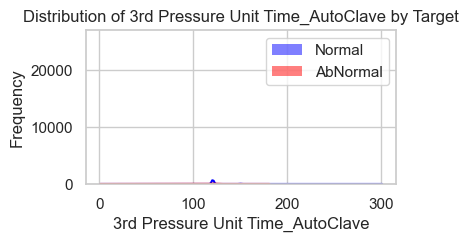

In [116]:
data_ana(DA_data, '1st Pressure 1st Pressure Unit Time_AutoClave')
data_ana(DA_data, '2nd Pressure Unit Time_AutoClave')
data_ana(DA_data, '3rd Pressure Unit Time_AutoClave')

+++++++++ unique 확인 +++++++++
54    8427
49    5836
50    5652
53    5342
48    3347
55    3282
52    2081
47    1787
56    1699
51    1478
57     951
46     376
58     102
45      37
36      33
32      23
43      20
37       6
38       6
59       4
33       4
35       4
44       3
40       3
34       2
42       1
Name: Chamber Temp. Collect Result_AutoClave, dtype: int64

 +++++++++ 시각화 +++++++++


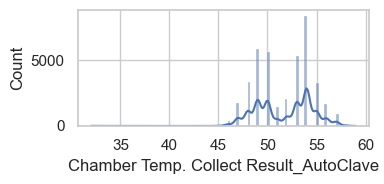


 +++++++++ unique 확인 / target 별 +++++++++
target                                  AbNormal    Normal
Chamber Temp. Collect Result_AutoClave                    
32                                      0.005532  0.000262
33                                      0.000000  0.000105
34                                      0.000851  0.000000
35                                      0.000426  0.000079
36                                      0.000851  0.000812
37                                      0.000000  0.000157
38                                      0.000000  0.000157
40                                      0.000000  0.000079
42                                      0.000426  0.000000
43                                      0.001702  0.000419
44                                      0.000000  0.000079
45                                      0.001277  0.000891
46                                      0.015745  0.008885
47                                      0.045532  0.044030
48           

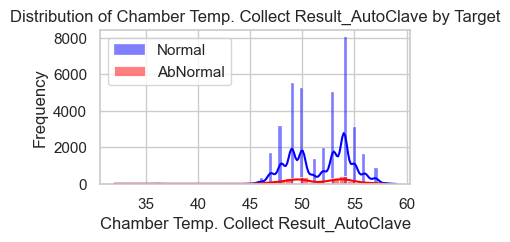

In [117]:
data_ana(DA_data, 'Chamber Temp. Collect Result_AutoClave')

+++++++++ unique 확인 +++++++++
363    14842
483    10802
480     6003
361     3940
510     1712
452     1510
450      424
362      395
481      371
360      179
512       82
540       72
423       55
301       29
212       24
300       14
183       13
303       11
243        9
180        6
242        6
3          4
61         2
121        1
Name: Chamber Temp. Unit Time_AutoClave, dtype: int64

 +++++++++ 시각화 +++++++++


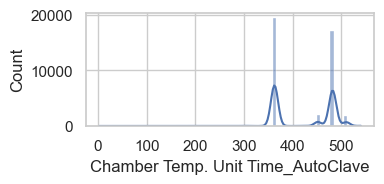


 +++++++++ unique 확인 / target 별 +++++++++
target                             AbNormal    Normal
Chamber Temp. Unit Time_AutoClave                    
3                                  0.000000  0.000105
61                                 0.000851  0.000000
121                                0.000000  0.000026
180                                0.002553  0.000000
183                                0.005532  0.000000
212                                0.005106  0.000314
242                                0.001277  0.000079
243                                0.000000  0.000236
300                                0.001277  0.000288
301                                0.001702  0.000655
303                                0.000426  0.000262
360                                0.003830  0.004455
361                                0.084255  0.098071
362                                0.010638  0.009697
363                                0.301277  0.370427
423                                0.00

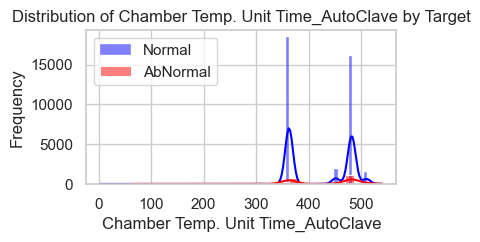

In [118]:
data_ana(DA_data, 'Chamber Temp. Unit Time_AutoClave')

+++++++++ unique 확인 +++++++++
OK    29112
NG    11394
Name: Chamber Temp. Judge Value_AutoClave, dtype: int64

 +++++++++ 시각화 +++++++++


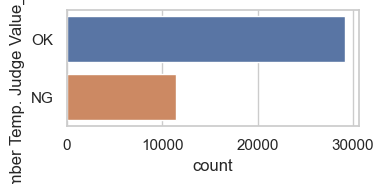


 +++++++++ unique 확인 / target 별 +++++++++
target                               AbNormal    Normal
Chamber Temp. Judge Value_AutoClave                    
NG                                   0.277021  0.281555
OK                                   0.722979  0.718445


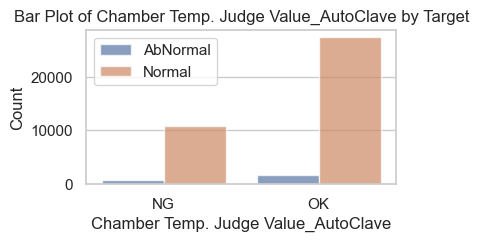

In [119]:
data_ana(DA_data, 'Chamber Temp. Judge Value_AutoClave')

# 3. 전체 상관 확인

Text(0.5, 1.0, 'Correlation Heatmap')

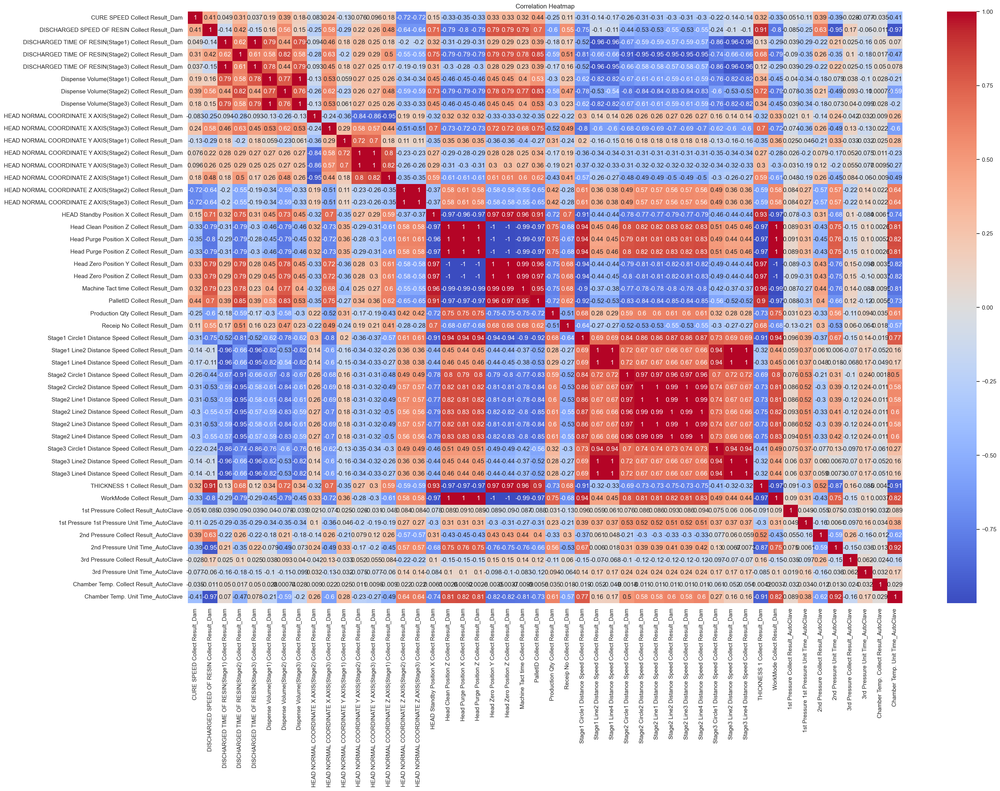

In [120]:
sns.set(font_scale=1)
plt.figure(figsize=(30, 20))
sns.heatmap(DA_data.corr(method='pearson'), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')

# 4.1 원데이터로 성능 확인

In [149]:
from pycaret.classification import *
from sklearn.model_selection import train_test_split

y = raw_data['target']
X = raw_data.drop('target', axis=1)

train_val_data, test_X, train_val_labels, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42)

# 그런 다음 Train + Validation 세트를 Train 세트와 Validation 세트로 나눔
train_X, val_X, train_y, val_y = train_test_split(
    train_val_data, train_val_labels, test_size=0.25, random_state=42)  # 0.25 * 0.8 = 0.2

# 결과 확인
print(f"Train set: {train_X.shape}")
print(f"Validation set: {val_X.shape}")
print(f"Test set: {test_X.shape}")

ValueError: sklearn.tree._criterion.Criterion size changed, may indicate binary incompatibility. Expected 528 from C header, got 352 from PyObject

In [192]:
clf = setup(data = train_X, target = train_y, session_id = 42)

,Description,Value
0,Session id,42
1,Target,target
2,Target type,Binary
3,Target mapping,"AbNormal: 0, Normal: 1"
4,Original data shape,"(24303, 80)"
5,Transformed data shape,"(24303, 92)"
6,Transformed train set shape,"(17012, 92)"
7,Transformed test set shape,"(7291, 92)"
8,Ordinal features,2
9,Numeric features,73


In [194]:
models = compare_models(sort = 'F1', n_select = 5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.9429,0.6454,0.9429,0.9226,0.9202,0.0900,0.1596,2.8580
rf,Random Forest Classifier,0.9396,0.6523,0.9396,0.9135,0.9198,0.1048,0.1462,0.3240
lightgbm,Light Gradient Boosting Machine,0.9430,0.6497,0.9430,0.9223,0.9198,0.0829,0.1533,0.2420
xgboost,Extreme Gradient Boosting,0.9407,0.6479,0.9407,0.9140,0.9196,0.0953,0.1415,0.1750
gbc,Gradient Boosting Classifier,0.9439,0.6460,0.9439,0.9352,0.9195,0.0742,0.1667,0.6760
ridge,Ridge Classifier,0.9430,0.0000,0.9430,0.9254,0.9183,0.0592,0.1332,0.1030
et,Extra Trees Classifier,0.9329,0.6469,0.9329,0.9076,0.9173,0.1129,0.1305,0.3050
ada,Ada Boost Classifier,0.9427,0.6313,0.9427,0.9180,0.9164,0.0321,0.0858,0.2770
knn,K Neighbors Classifier,0.9403,0.5718,0.9403,0.9066,0.9156,0.0335,0.0680,0.3880
lda,Linear Discriminant Analysis,0.9313,0.6422,0.9313,0.9044,0.9154,0.0924,0.1062,0.1900


In [195]:
cat = create_model('catboost', fold = 10)
gbc = create_model('gbc', fold = 10)
et = create_model('et', fold = 10)
lgm = create_model('lightgbm', fold = 10)
rf = create_model('rf', fold = 10)


m1 = tune_model(cat, fold = 10, n_iter = 10, optimize = 'F1')
m2 = tune_model(gbc, fold = 10, n_iter = 10, optimize = 'F1')
m3 = tune_model(et, fold = 10, n_iter = 10, optimize = 'F1')
m4 = tune_model(lgm, fold = 10, n_iter = 10, optimize = 'F1')
m5 = tune_model(rf, fold = 10, n_iter = 10, optimize = 'F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9418,0.6468,0.9418,0.9176,0.9169,0.0508,0.1123
1,0.9395,0.6377,0.9395,0.9083,0.9166,0.0603,0.0991
2,0.9459,0.6313,0.9459,0.9344,0.9263,0.1666,0.2567
3,0.9418,0.6397,0.9418,0.9184,0.9212,0.1103,0.1656
4,0.9424,0.6075,0.9424,0.9189,0.9187,0.0674,0.1305
5,0.9447,0.6335,0.9447,0.9306,0.9239,0.1346,0.2203
6,0.9430,0.6496,0.9430,0.9225,0.9210,0.0996,0.1689
7,0.9447,0.6991,0.9447,0.9344,0.9220,0.1054,0.2043
8,0.9447,0.6755,0.9447,0.9387,0.9211,0.0901,0.1981


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9407,0.6300,0.9407,0.9074,0.9152,0.0317,0.0699
1,0.9418,0.6419,0.9418,0.9171,0.9158,0.0345,0.0916
2,0.9465,0.6323,0.9465,0.9376,0.9267,0.1690,0.2680
3,0.9453,0.6394,0.9453,0.9365,0.9233,0.1223,0.2254
4,0.9436,0.6134,0.9436,0.9285,0.9194,0.0707,0.1555
5,0.9442,0.6428,0.9442,0.9362,0.9197,0.0725,0.1730
6,0.9453,0.6549,0.9453,0.9483,0.9214,0.0920,0.2196
7,0.9447,0.6905,0.9447,0.9478,0.9201,0.0742,0.1964
8,0.9442,0.6967,0.9442,0.9473,0.9187,0.0562,0.1700


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9318,0.6543,0.9318,0.9031,0.9147,0.0822,0.0976
1,0.9360,0.5972,0.9360,0.9056,0.9163,0.0797,0.1049
2,0.9330,0.6274,0.9330,0.9086,0.9181,0.1221,0.1389
3,0.9353,0.6530,0.9353,0.9129,0.9210,0.1529,0.1740
4,0.9365,0.6675,0.9365,0.9095,0.9188,0.1075,0.1337
5,0.9265,0.6670,0.9265,0.9045,0.9142,0.1045,0.1122
6,0.9324,0.6450,0.9324,0.9040,0.9155,0.0831,0.0983
7,0.9347,0.6689,0.9347,0.9134,0.9213,0.1623,0.1813
8,0.9336,0.6758,0.9336,0.9091,0.9185,0.1238,0.1419


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9412,0.6481,0.9412,0.9148,0.9176,0.0650,0.1203
1,0.9418,0.6287,0.9418,0.9181,0.9179,0.0666,0.1297
2,0.9465,0.6399,0.9465,0.9399,0.9259,0.1553,0.2633
3,0.9436,0.6331,0.9436,0.9250,0.9231,0.1303,0.2009
4,0.9424,0.6176,0.9424,0.9189,0.9187,0.0674,0.1305
5,0.9442,0.6542,0.9442,0.9296,0.9217,0.1035,0.1906
6,0.9436,0.6504,0.9436,0.9285,0.9194,0.0707,0.1555
7,0.9430,0.7077,0.9430,0.9226,0.9200,0.0846,0.1559
8,0.9447,0.6918,0.9447,0.9387,0.9211,0.0901,0.1981


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9377,0.6527,0.9377,0.9064,0.9165,0.0704,0.1013
1,0.9418,0.6238,0.9418,0.9191,0.9198,0.0967,0.1591
2,0.9400,0.6246,0.9400,0.9160,0.9217,0.1317,0.1727
3,0.9412,0.6340,0.9412,0.9199,0.9240,0.1613,0.2057
4,0.9406,0.6554,0.9406,0.9152,0.9204,0.1065,0.1527
5,0.9389,0.6629,0.9389,0.9115,0.9194,0.1011,0.1369
6,0.9389,0.6340,0.9389,0.9084,0.9176,0.0727,0.1066
7,0.9389,0.6968,0.9389,0.9128,0.9202,0.1146,0.1503
8,0.9436,0.6992,0.9436,0.9250,0.9240,0.1441,0.2111


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9418,0.6206,0.9418,0.9171,0.9158,0.0345,0.0916
1,0.9412,0.6457,0.9412,0.9113,0.9155,0.0331,0.0793
2,0.9459,0.6236,0.9459,0.9333,0.9271,0.1797,0.2634
3,0.9447,0.6390,0.9447,0.9320,0.9230,0.1202,0.2120
4,0.9424,0.6200,0.9424,0.9189,0.9187,0.0674,0.1305
5,0.9430,0.6446,0.9430,0.9226,0.9200,0.0846,0.1559
6,0.9442,0.6424,0.9442,0.9318,0.9207,0.0882,0.1812
7,0.9442,0.6836,0.9442,0.9318,0.9207,0.0882,0.1812
8,0.9442,0.6674,0.9442,0.9473,0.9187,0.0562,0.1700


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9418,0.6276,0.9418,0.9171,0.9158,0.0345,0.0916
1,0.9430,0.6517,0.9430,0.9322,0.9175,0.0540,0.1435
2,0.9465,0.6453,0.9465,0.9376,0.9267,0.1690,0.2680
3,0.9453,0.6366,0.9453,0.9406,0.9224,0.1074,0.2206
4,0.9436,0.6277,0.9436,0.9285,0.9194,0.0707,0.1555
5,0.9442,0.6464,0.9442,0.9296,0.9217,0.1035,0.1906
6,0.9436,0.6532,0.9436,0.9266,0.9204,0.0864,0.1674
7,0.9436,0.7033,0.9436,0.9266,0.9204,0.0864,0.1674
8,0.9436,0.6922,0.9436,0.9285,0.9194,0.0707,0.1555


Fitting 10 folds for each of 10 candidates, totalling 100 fits


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9424,0.6392,0.9424,0.9457,0.9151,0.0189,0.0976
1,0.9412,0.6761,0.9412,0.9069,0.9145,0.0162,0.0494
2,0.9436,0.6497,0.9436,0.9266,0.9204,0.0864,0.1674
3,0.9442,0.6768,0.9442,0.9473,0.9187,0.0562,0.1700
4,0.9430,0.6618,0.9430,0.9275,0.9170,0.0363,0.1099
5,0.9418,0.6733,0.9418,0.8881,0.9141,-0.0012,-0.0060
6,0.9418,0.6723,0.9418,0.8881,0.9141,-0.0012,-0.0060
7,0.9430,0.6960,0.9430,0.9275,0.9170,0.0363,0.1099
8,0.9430,0.7107,0.9430,0.9242,0.9180,0.0530,0.1264


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9412,0.6651,0.9412,0.9159,0.9185,0.0802,0.1366
1,0.9424,0.6229,0.9424,0.9235,0.9172,0.0524,0.1257
2,0.9483,0.6370,0.9483,0.9510,0.9279,0.1764,0.3110
3,0.9412,0.6494,0.9412,0.9157,0.9199,0.0941,0.1450
4,0.9442,0.6292,0.9442,0.9362,0.9197,0.0725,0.1730
5,0.9436,0.6507,0.9436,0.9257,0.9213,0.1015,0.1790
6,0.9430,0.6387,0.9430,0.9226,0.9200,0.0846,0.1559
7,0.9418,0.6867,0.9418,0.9156,0.9184,0.0657,0.1211
8,0.9424,0.6947,0.9424,0.9194,0.9197,0.0828,0.1460


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9424,0.6336,0.9424,0.9457,0.9151,0.0189,0.0976
1,0.9418,0.6536,0.9418,0.9166,0.9148,0.0175,0.0647
2,0.9465,0.6394,0.9465,0.9494,0.9241,0.1266,0.2600
3,0.9459,0.6562,0.9459,0.9488,0.9227,0.1095,0.2406
4,0.9436,0.6502,0.9436,0.9328,0.9184,0.0546,0.1443
5,0.9430,0.6663,0.9430,0.9275,0.9170,0.0363,0.1099
6,0.9442,0.6575,0.9442,0.9473,0.9187,0.0562,0.1700
7,0.9430,0.7014,0.9430,0.9275,0.9170,0.0363,0.1099
8,0.9436,0.7042,0.9436,0.9328,0.9184,0.0546,0.1443


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [196]:
blended = blend_models(estimator_list = [m1, m2, m3, m4, m5],
                       fold = 10,
                       method = 'soft',
                       optimize='F1'
                       )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9424,0.6554,0.9424,0.9223,0.9182,0.0683,0.1409
1,0.9424,0.6329,0.9424,0.9223,0.9182,0.0683,0.1409
2,0.9453,0.6383,0.9453,0.9316,0.9259,0.1642,0.2465
3,0.9430,0.6513,0.9430,0.9226,0.9219,0.1142,0.1811
4,0.9442,0.6413,0.9442,0.9318,0.9207,0.0882,0.1812
5,0.9447,0.6613,0.9447,0.9320,0.9230,0.1202,0.2120
6,0.9430,0.6558,0.9430,0.9226,0.9200,0.0846,0.1559
7,0.9424,0.7100,0.9424,0.9194,0.9197,0.0828,0.1460
8,0.9447,0.7026,0.9447,0.9344,0.9220,0.1054,0.2043


In [197]:
pred1 = predict_model(blended, data=val_X)

In [198]:
from sklearn.metrics import f1_score

thresholds = np.arange(0.50, 1.00, 0.01)

f1_scores = []

for threshold in thresholds:
    # 임계값을 기준으로 라벨 생성
    y_pred = ['AbNormal' if score >= threshold else 'Normal' for score in pred1['prediction_score']]
    
    # F1 스코어 계산
    f1 = f1_score(val_y, y_pred, pos_label='AbNormal')
    f1_scores.append((threshold, f1))

# 결과 출력
for threshold, f1 in f1_scores:
    print(f"Threshold: {threshold:.2f}, F1 Score: {f1:.4f}")

Threshold: 0.50, F1 Score: 0.1134
Threshold: 0.51, F1 Score: 0.1132
Threshold: 0.52, F1 Score: 0.1128
Threshold: 0.53, F1 Score: 0.1127
Threshold: 0.54, F1 Score: 0.1127
Threshold: 0.55, F1 Score: 0.1121
Threshold: 0.56, F1 Score: 0.1120
Threshold: 0.57, F1 Score: 0.1116
Threshold: 0.58, F1 Score: 0.1116
Threshold: 0.59, F1 Score: 0.1110
Threshold: 0.60, F1 Score: 0.1108
Threshold: 0.61, F1 Score: 0.1104
Threshold: 0.62, F1 Score: 0.1096
Threshold: 0.63, F1 Score: 0.1092
Threshold: 0.64, F1 Score: 0.1079
Threshold: 0.65, F1 Score: 0.1076
Threshold: 0.66, F1 Score: 0.1059
Threshold: 0.67, F1 Score: 0.1052
Threshold: 0.68, F1 Score: 0.1049
Threshold: 0.69, F1 Score: 0.1043
Threshold: 0.70, F1 Score: 0.1036
Threshold: 0.71, F1 Score: 0.1031
Threshold: 0.72, F1 Score: 0.1026
Threshold: 0.73, F1 Score: 0.1024
Threshold: 0.74, F1 Score: 0.1017
Threshold: 0.75, F1 Score: 0.1004
Threshold: 0.76, F1 Score: 0.0994
Threshold: 0.77, F1 Score: 0.0985
Threshold: 0.78, F1 Score: 0.0982
Threshold: 0.7

# 4.1 현 상태로 성능 확인

In [121]:
from pycaret.classification import *
from sklearn.model_selection import train_test_split

y = DA_data['target']
X = DA_data.drop('target', axis=1)

train_val_data, test_X, train_val_labels, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42)

# 그런 다음 Train + Validation 세트를 Train 세트와 Validation 세트로 나눔
train_X, val_X, train_y, val_y = train_test_split(
    train_val_data, train_val_labels, test_size=0.25, random_state=42)  # 0.25 * 0.8 = 0.2

# 결과 확인
print(f"Train set: {train_X.shape}")
print(f"Validation set: {val_X.shape}")
print(f"Test set: {test_X.shape}")

Train set: (24303, 64)
Validation set: (8101, 64)
Test set: (8102, 64)


In [122]:
clf = setup(data = train_X, target = train_y, session_id = 42)

,Description,Value
0,Session id,42
1,Target,target
2,Target type,Binary
3,Target mapping,"AbNormal: 0, Normal: 1"
4,Original data shape,"(24303, 65)"
5,Transformed data shape,"(24303, 136)"
6,Transformed train set shape,"(17012, 136)"
7,Transformed test set shape,"(7291, 136)"
8,Ordinal features,6
9,Numeric features,48


In [123]:
models = compare_models(sort = 'AUC', n_select = 5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.9432,0.6459,0.9432,0.9241,0.9188,0.0661,0.1392,2.8670
gbc,Gradient Boosting Classifier,0.9434,0.6447,0.9434,0.9277,0.9182,0.0553,0.1331,0.7440
et,Extra Trees Classifier,0.9344,0.6394,0.9344,0.9063,0.9170,0.0957,0.1155,0.4210
lightgbm,Light Gradient Boosting Machine,0.9434,0.6389,0.9434,0.9283,0.9184,0.0588,0.1386,0.2700
rf,Random Forest Classifier,0.9412,0.6379,0.9412,0.9141,0.9190,0.0833,0.1322,0.3910
lda,Linear Discriminant Analysis,0.9419,0.6292,0.9419,0.9163,0.9186,0.0713,0.1257,0.2720
ada,Ada Boost Classifier,0.9427,0.6283,0.9427,0.9159,0.9165,0.0337,0.0856,0.3620
xgboost,Extreme Gradient Boosting,0.9421,0.6237,0.9421,0.9169,0.9190,0.0770,0.1344,0.2350
qda,Quadratic Discriminant Analysis,0.1038,0.6138,0.1038,0.9096,0.0974,0.0020,0.0182,0.2680
lr,Logistic Regression,0.9423,0.6116,0.9423,0.9235,0.9155,0.0196,0.0744,1.7280


In [124]:
cat = create_model('catboost', fold = 10)
gbc = create_model('gbc', fold = 10)
et = create_model('et', fold = 10)
lgm = create_model('lightgbm', fold = 10)
rf = create_model('rf', fold = 10)


m1 = tune_model(cat, fold = 10, n_iter = 10, optimize = 'F1')
m2 = tune_model(gbc, fold = 10, n_iter = 10, optimize = 'F1')
m3 = tune_model(et, fold = 10, n_iter = 10, optimize = 'F1')
m4 = tune_model(lgm, fold = 10, n_iter = 10, optimize = 'F1')
m5 = tune_model(rf, fold = 10, n_iter = 10, optimize = 'F1')



,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9418,0.6116,0.9418,0.9171,0.9158,0.0345,0.0916
1,0.9407,0.6265,0.9407,0.9020,0.9141,0.0150,0.0398
2,0.9471,0.6514,0.9471,0.9446,0.9262,0.1577,0.2780
3,0.9453,0.6791,0.9453,0.9341,0.9242,0.1368,0.2319
4,0.9418,0.6764,0.9418,0.9142,0.9174,0.0498,0.1023
5,0.9436,0.6199,0.9436,0.9285,0.9194,0.0707,0.1555
6,0.9430,0.6174,0.9430,0.9242,0.9180,0.0530,0.1264
7,0.9442,0.6815,0.9442,0.9362,0.9197,0.0725,0.1730
8,0.9436,0.6471,0.9436,0.9328,0.9184,0.0546,0.1443


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9412,0.6111,0.9412,0.9069,0.9145,0.0162,0.0494
1,0.9412,0.6290,0.9412,0.9069,0.9145,0.0162,0.0494
2,0.9453,0.6740,0.9453,0.9341,0.9242,0.1368,0.2319
3,0.9465,0.6951,0.9465,0.9494,0.9241,0.1266,0.2600
4,0.9424,0.6640,0.9424,0.9179,0.9167,0.0349,0.0922
5,0.9442,0.6211,0.9442,0.9473,0.9187,0.0562,0.1700
6,0.9436,0.6222,0.9436,0.9328,0.9184,0.0546,0.1443
7,0.9442,0.6537,0.9442,0.9473,0.9187,0.0562,0.1700
8,0.9442,0.6477,0.9442,0.9473,0.9187,0.0562,0.1700


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9318,0.6242,0.9318,0.8978,0.9123,0.0420,0.0531
1,0.9348,0.6438,0.9348,0.9003,0.9139,0.0486,0.0661
2,0.9377,0.6191,0.9377,0.9144,0.9218,0.1489,0.1777
3,0.9400,0.6575,0.9400,0.9186,0.9240,0.1692,0.2060
4,0.9359,0.6786,0.9359,0.9057,0.9168,0.0790,0.1021
5,0.9300,0.6162,0.9300,0.9039,0.9149,0.0898,0.1015
6,0.9336,0.6102,0.9336,0.8996,0.9137,0.0452,0.0584
7,0.9365,0.6488,0.9365,0.9131,0.9210,0.1450,0.1700
8,0.9330,0.6582,0.9330,0.9060,0.9166,0.0975,0.1143


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9418,0.6008,0.9418,0.9166,0.9148,0.0175,0.0647
1,0.9418,0.6264,0.9418,0.9166,0.9148,0.0175,0.0647
2,0.9465,0.6244,0.9465,0.9435,0.9250,0.1412,0.2602
3,0.9453,0.7007,0.9453,0.9406,0.9224,0.1074,0.2206
4,0.9424,0.6433,0.9424,0.9184,0.9177,0.0514,0.1130
5,0.9436,0.6184,0.9436,0.9328,0.9184,0.0546,0.1443
6,0.9442,0.6014,0.9442,0.9473,0.9187,0.0562,0.1700
7,0.9442,0.6767,0.9442,0.9362,0.9197,0.0725,0.1730
8,0.9430,0.6548,0.9430,0.9242,0.9180,0.0530,0.1264


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9389,0.6198,0.9389,0.9008,0.9143,0.0276,0.0511
1,0.9401,0.6103,0.9401,0.9046,0.9149,0.0303,0.0625
2,0.9412,0.6385,0.9412,0.9176,0.9217,0.1222,0.1717
3,0.9447,0.6520,0.9447,0.9297,0.9247,0.1484,0.2288
4,0.9430,0.6826,0.9430,0.9225,0.9210,0.0996,0.1689
5,0.9406,0.6107,0.9406,0.9140,0.9196,0.0923,0.1386
6,0.9406,0.5984,0.9406,0.9109,0.9177,0.0625,0.1060
7,0.9412,0.6859,0.9412,0.9167,0.9208,0.1084,0.1589
8,0.9412,0.6582,0.9412,0.9145,0.9190,0.0793,0.1299


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9418,0.6259,0.9418,0.9171,0.9158,0.0345,0.0916
1,0.9424,0.6154,0.9424,0.9457,0.9151,0.0189,0.0976
2,0.9459,0.6317,0.9459,0.9359,0.9255,0.1530,0.2505
3,0.9442,0.6906,0.9442,0.9296,0.9217,0.1035,0.1906
4,0.9430,0.6461,0.9430,0.9242,0.9180,0.0530,0.1264
5,0.9436,0.6184,0.9436,0.9328,0.9184,0.0546,0.1443
6,0.9442,0.5979,0.9442,0.9473,0.9187,0.0562,0.1700
7,0.9442,0.6655,0.9442,0.9473,0.9187,0.0562,0.1700
8,0.9442,0.6372,0.9442,0.9473,0.9187,0.0562,0.1700


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9418,0.6035,0.9418,0.9166,0.9148,0.0175,0.0647
1,0.9412,0.6183,0.9412,0.9069,0.9145,0.0162,0.0494
2,0.9453,0.6599,0.9453,0.9341,0.9242,0.1368,0.2319
3,0.9453,0.6688,0.9453,0.9406,0.9224,0.1074,0.2206
4,0.9430,0.6504,0.9430,0.9230,0.9191,0.0690,0.1418
5,0.9436,0.6148,0.9436,0.9328,0.9184,0.0546,0.1443
6,0.9424,0.6078,0.9424,0.9184,0.9177,0.0514,0.1130
7,0.9436,0.5989,0.9436,0.9328,0.9184,0.0546,0.1443
8,0.9430,0.6468,0.9430,0.9242,0.9180,0.0530,0.1264


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9424,0.6093,0.9424,0.9457,0.9151,0.0189,0.0976
1,0.9424,0.6361,0.9424,0.9457,0.9151,0.0189,0.0976
2,0.9447,0.6661,0.9447,0.9478,0.9201,0.0742,0.1964
3,0.9430,0.6804,0.9430,0.9462,0.9159,0.0191,0.0981
4,0.9430,0.6940,0.9430,0.9275,0.9170,0.0363,0.1099
5,0.9418,0.6404,0.9418,0.8881,0.9141,-0.0012,-0.0060
6,0.9424,0.6504,0.9424,0.8881,0.9144,0.0000,0.0000
7,0.9418,0.6587,0.9418,0.8881,0.9141,-0.0012,-0.0060
8,0.9424,0.6822,0.9424,0.9174,0.9156,0.0177,0.0651


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9430,0.6204,0.9430,0.9463,0.9165,0.0374,0.1380
1,0.9418,0.6008,0.9418,0.9166,0.9148,0.0175,0.0647
2,0.9471,0.6084,0.9471,0.9499,0.9254,0.1435,0.2780
3,0.9453,0.6645,0.9453,0.9406,0.9224,0.1074,0.2206
4,0.9424,0.6206,0.9424,0.9184,0.9177,0.0514,0.1130
5,0.9418,0.6255,0.9418,0.9142,0.9174,0.0498,0.1023
6,0.9436,0.5803,0.9436,0.9285,0.9194,0.0707,0.1555
7,0.9424,0.6424,0.9424,0.9184,0.9177,0.0514,0.1130
8,0.9436,0.6680,0.9436,0.9328,0.9184,0.0546,0.1443


Fitting 10 folds for each of 10 candidates, totalling 100 fits


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9424,0.6149,0.9424,0.9457,0.9151,0.0189,0.0976
1,0.9418,0.6490,0.9418,0.9166,0.9148,0.0175,0.0647
2,0.9453,0.6668,0.9453,0.9483,0.9214,0.0920,0.2196
3,0.9447,0.6715,0.9447,0.9478,0.9201,0.0742,0.1964
4,0.9436,0.6899,0.9436,0.9328,0.9184,0.0546,0.1443
5,0.9430,0.6460,0.9430,0.9275,0.9170,0.0363,0.1099
6,0.9436,0.6439,0.9436,0.9468,0.9173,0.0378,0.1388
7,0.9430,0.6706,0.9430,0.9275,0.9170,0.0363,0.1099
8,0.9430,0.6766,0.9430,0.9242,0.9180,0.0530,0.1264


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [126]:
blended = blend_models(estimator_list = [m1, m2, m3, m4, m5],
                       fold = 10,
                       method = 'soft',
                       optimize='F1'
                       )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9424,0.6379,0.9424,0.9268,0.9162,0.0359,0.1092
1,0.9418,0.6495,0.9418,0.9166,0.9148,0.0175,0.0647
2,0.9471,0.6528,0.9471,0.9446,0.9262,0.1577,0.2780
3,0.9459,0.6901,0.9459,0.9421,0.9237,0.1245,0.2411
4,0.9436,0.6948,0.9436,0.9285,0.9194,0.0707,0.1555
5,0.9430,0.6284,0.9430,0.9230,0.9191,0.0690,0.1418
6,0.9442,0.6160,0.9442,0.9362,0.9197,0.0725,0.1730
7,0.9453,0.6920,0.9453,0.9483,0.9214,0.0920,0.2196
8,0.9442,0.6830,0.9442,0.9473,0.9187,0.0562,0.1700


In [128]:
pred1 = predict_model(blended, data=val_X)

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


In [149]:
from sklearn.metrics import f1_score

thresholds = np.arange(0.50, 1.00, 0.01)

f1_scores = []

for threshold in thresholds:
    # 임계값을 기준으로 라벨 생성
    y_pred = ['AbNormal' if score >= threshold else 'Normal' for score in pred1['prediction_score']]
    
    # F1 스코어 계산
    f1 = f1_score(val_y, y_pred, pos_label='AbNormal')
    f1_scores.append((threshold, f1))

# 결과 출력
for threshold, f1 in f1_scores:
    print(f"Threshold: {threshold:.2f}, F1 Score: {f1:.4f}")

Threshold: 0.50, F1 Score: 0.1134
Threshold: 0.51, F1 Score: 0.1128
Threshold: 0.52, F1 Score: 0.1126
Threshold: 0.53, F1 Score: 0.1124
Threshold: 0.54, F1 Score: 0.1124
Threshold: 0.55, F1 Score: 0.1119
Threshold: 0.56, F1 Score: 0.1120
Threshold: 0.57, F1 Score: 0.1120
Threshold: 0.58, F1 Score: 0.1118
Threshold: 0.59, F1 Score: 0.1118
Threshold: 0.60, F1 Score: 0.1113
Threshold: 0.61, F1 Score: 0.1112
Threshold: 0.62, F1 Score: 0.1109
Threshold: 0.63, F1 Score: 0.1107
Threshold: 0.64, F1 Score: 0.1108
Threshold: 0.65, F1 Score: 0.1104
Threshold: 0.66, F1 Score: 0.1104
Threshold: 0.67, F1 Score: 0.1098
Threshold: 0.68, F1 Score: 0.1097
Threshold: 0.69, F1 Score: 0.1094
Threshold: 0.70, F1 Score: 0.1090
Threshold: 0.71, F1 Score: 0.1082
Threshold: 0.72, F1 Score: 0.1074
Threshold: 0.73, F1 Score: 0.1062
Threshold: 0.74, F1 Score: 0.1053
Threshold: 0.75, F1 Score: 0.1041
Threshold: 0.76, F1 Score: 0.1038
Threshold: 0.77, F1 Score: 0.1036
Threshold: 0.78, F1 Score: 0.1025
Threshold: 0.7

# 4.3 X 좌표 범주화하여 확인

In [200]:
numeric_columns = [
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam'
]

# 'OK' 값을 가진 행 제거
DA_data_filtered = DA_data.copy()

# 숫자 열만 선택하여 float로 변환
DA_data_filtered = DA_data_filtered.reset_index()


# 연결 선 그리기
for i in range(len(DA_data_filtered)):
    print("Index:", i, "Stage 1 -> Stage 2 Line:", 
          DA_data_filtered.loc[i, ['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam']].tolist(),
          "->",
          DA_data_filtered.loc[i, ['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam']].tolist())





Index: 0 Stage 1 -> Stage 2 Line: ['NG', 161.4, 384.0] -> [550.5, 384.0, 274.51]
Index: 1 Stage 1 -> Stage 2 Line: ['550.3', 377.3, 282.15] -> [463.8, 377.3, 282.15]
Index: 2 Stage 1 -> Stage 2 Line: ['OK', 551.7, 1271.8] -> [162.4, 1271.8, 274.33]
Index: 3 Stage 1 -> Stage 2 Line: ['162.4', 1271.8, 282.15] -> [465.5, 1270.7, 282.15]
Index: 4 Stage 1 -> Stage 2 Line: ['549', 377.5, 284.8] -> [462.5, 377.0, 284.8]
Index: 5 Stage 1 -> Stage 2 Line: ['549', 377.5, 284.8] -> [463.0, 377.0, 284.8]
Index: 6 Stage 1 -> Stage 2 Line: ['OK', 161.3, 377.6] -> [550.4, 377.6, 282.5]
Index: 7 Stage 1 -> Stage 2 Line: ['OK', 552.0, 1271.8] -> [162.7, 1271.8, 280.894]
Index: 8 Stage 1 -> Stage 2 Line: ['549', 377.5, 284.8] -> [462.5, 377.0, 284.8]
Index: 9 Stage 1 -> Stage 2 Line: ['549', 377.5, 284.8] -> [462.5, 377.0, 284.8]
Index: 10 Stage 1 -> Stage 2 Line: ['OK', 551.7, 1271.8] -> [162.4, 1271.8, 274.33]
Index: 11 Stage 1 -> Stage 2 Line: ['OK', 551.0, 1271.8] -> [161.7, 1271.8, 280.894]
Index: 

누락된 NaN과 오버랩된 OK가 거의 랜덤하게 패턴화되어있음

In [85]:
import miceforest as mf
AXIS_data = train_data[['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam',]]

AXIS_data['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] = AXIS_data['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].replace('OK', np.nan)
AXIS_data['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] = AXIS_data['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float)


kds = mf.ImputationKernel(AXIS_data, random_state=42)
kds.mice(50)
df_imp = kds.complete_data()

In [88]:
df_imp

,HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam
0,549.0,161.4,384.00,550.5,384.0,274.51,464.3,383.1,274.51
1,550.3,377.3,282.15,463.8,377.3,282.15,160.8,377.3,282.15
2,549.0,551.7,1271.80,162.4,1271.8,274.33,465.4,1383.9,274.33
3,162.4,1271.8,282.15,465.5,1270.7,282.15,552.0,1271.8,282.15
4,549.0,377.5,284.80,462.5,377.0,284.80,159.5,377.5,284.80
...,...,...,...,...,...,...,...,...,...
40501,550.3,377.3,282.15,463.8,377.3,282.15,160.8,377.3,282.15
40502,549.0,553.1,1281.20,163.5,1281.0,274.33,466.2,1393.5,274.33
40503,549.0,161.5,378.00,550.6,377.6,274.78,463.9,377.1,274.78
40504,162.4,1269.0,282.15,465.1,1268.4,282.15,551.3,1269.0,282.15


In [ ]:
DA_data['HEAD same POSITION Result_Dam'] = DA_data.apply(lambda row: (row['HEAD Standby Position Y Collect Result_Dam'],
                                                           row['HEAD Standby Position Z Collect Result_Dam'],
                                                           row['Head Clean Position Y Collect Result_Dam'],
                                                           row['Head Purge Position Y Collect Result_Dam'],
                                                           row['Head Clean Position X Collect Result_Dam'],
                                                           row['Head Zero Position X Collect Result_Dam']), axis=1)
DA_data = DA_data.drop(['HEAD Standby Position Y Collect Result_Dam', 'HEAD Standby Position Z Collect Result_Dam',
                       'Head Clean Position Y Collect Result_Dam', 'Head Purge Position Y Collect Result_Dam',
                       'Head Clean Position X Collect Result_Dam', 'Head Zero Position X Collect Result_Dam'], axis=1)

In [123]:
DA_data[['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam']] = df_imp[['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam']]

In [124]:
DA_data

,Equipment_Dam,Model.Suffix_Dam,CURE SPEED Collect Result_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam,Dispense Volume(Stage1) Collect Result_Dam,Dispense Volume(Stage2) Collect Result_Dam,Dispense Volume(Stage3) Collect Result_Dam,...,char_8_Dam,after_dash_Dam,CURE START/END POSITION Result_Dam,HEAD same POSITION Result_Dam,"Stage1 Circle 2,3,4 Distance Speed Result_Dam","Stage2 Circle 3,4 Distance Speed Result_Dam","Stage3 Circle 2,3,4 Distance Speed Result_Dam","Stage1 Line 1,3 Distance Speed Result_Dam","Stage3 Line 1,3 Distance Speed Result_Dam","THICKNESS 2,3 Result_Dam"
0,Dam dispenser #1,AJX75334505,100,16,14.9,8.4,14.7,1.04,0.58,1.02,...,8,1,"((1030, -90), (240.0, 2.5, -90))","(257, 66, 127.5, 257, 0.0, 130.85)","(5800, 5800, 5800)","(5300, 5300)","(5800, 5800, 5800)","(5800, 5800)","(5800, 5800)","(0.0, 0.0)"
1,Dam dispenser #1,AJX75334505,70,10,21.3,4.9,21.3,1.49,0.34,1.49,...,6,2,"((1030, -90), (240.0, 2.5, -90))","(66, 0, 66.0, 66, 127.5, 505.0)","(4000, 4000, 4000)","(9000, 9000)","(4000, 4000, 4000)","(4000, 4000)","(4000, 4000)","(0.0, 0.0)"
2,Dam dispenser #2,AJX75334501,85,16,14.7,8.5,14.7,1.61,0.93,1.61,...,7,1,"((280, 90), (1000.0, 12.5, 90))","(257, 66, 127.5, 257, 0.0, 130.85)","(5800, 5800, 5800)","(5300, 5300)","(5800, 5800, 5800)","(5800, 5800)","(5800, 5800)","(0.012, -0.022)"
3,Dam dispenser #2,AJX75334501,70,10,21.3,8.4,21.3,1.49,0.58,1.49,...,7,1,"((280, 90), (1000.0, 12.5, 90))","(66, 0, 66.0, 66, 127.5, 505.0)","(4000, 4000, 4000)","(5000, 5000)","(4000, 4000, 4000)","(4000, 4000)","(4000, 4000)","(0.0, 0.0)"
4,Dam dispenser #1,AJX75334501,70,10,9.7,4.9,9.6,0.67,0.34,0.67,...,7,1,"((1030, -90), (240.0, 2.5, -90))","(66, 0, 66.0, 66, 127.5, 505.0)","(9000, 9000, 9000)","(9000, 9000)","(9000, 9000, 9000)","(9000, 9000)","(9000, 9000)","(0.0, 0.0)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40501,Dam dispenser #1,AJX75334501,70,10,17.0,5.0,17.0,1.19,0.35,1.19,...,4,2,"((1030, -90), (240.0, 2.5, -90))","(66, 0, 66.0, 66, 127.5, 505.0)","(5000, 5000, 5000)","(9000, 9000)","(5000, 5000, 5000)","(5000, 5000)","(5000, 5000)","(0.0, 0.0)"
40502,Dam dispenser #2,AJX75334501,100,16,14.9,8.5,14.7,1.04,0.59,1.02,...,6,1,"((280, 90), (1000.0, 12.5, 90))","(257, 66, 127.5, 257, 0.0, 130.85)","(5800, 5800, 5800)","(5300, 5300)","(5800, 5800, 5800)","(5800, 5800)","(5800, 5800)","(-0.019, -0.021)"
40503,Dam dispenser #1,AJX75334501,100,16,14.2,8.2,14.3,0.99,0.57,1.00,...,8,1,"((1030, -90), (240.0, 2.5, -90))","(257, 66, 127.5, 257, 0.0, 130.85)","(6000, 6000, 6000)","(5500, 5500)","(6000, 6000, 6000)","(6000, 6000)","(6000, 6000)","(0.0, 0.0)"
40504,Dam dispenser #2,AJX75334501,70,10,9.7,4.9,9.7,0.67,0.34,0.67,...,8,1,"((280, 90), (1000.0, 12.5, 90))","(66, 0, 66.0, 66, 127.5, 505.0)","(9000, 9000, 9000)","(9000, 9000)","(9000, 9000, 9000)","(9000, 9000)","(9000, 9000)","(0.0, 0.0)"


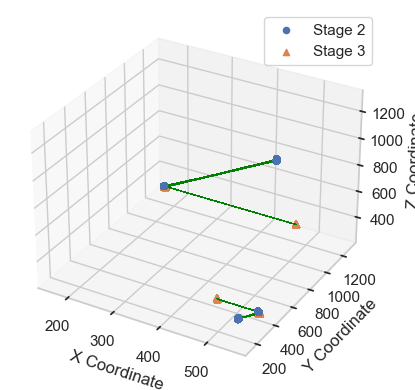

In [158]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

%matplotlib inline
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Stage 2의 점을 플로팅
ax.scatter(DA_data['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'],
           DA_data['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'],
           DA_data['HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam'],
           marker='o', label='Stage 2')

# Stage 3의 점을 플로팅
ax.scatter(DA_data['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam'],
           DA_data['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'],
           DA_data['HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam'],
            marker='^', label='Stage 3')

# Stage 2에서 Stage 3로 이어지는 선을 플로팅
for i in range(len(DA_data)):
    ax.plot([DA_data['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'][i], DA_data['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam'][i]],
            [DA_data['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'][i], DA_data['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'][i]],
            [DA_data['HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam'][i], DA_data['HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam'][i]],
            color='green', linewidth=0.2, alpha=0.5)

ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')
ax.legend()
plt.show()


In [155]:
from pycaret.classification import *
from sklearn.model_selection import train_test_split

y = DA_data['target']
X = DA_data.drop('target', axis=1)

train_val_data, test_X, train_val_labels, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42)

# 그런 다음 Train + Validation 세트를 Train 세트와 Validation 세트로 나눔
train_X, val_X, train_y, val_y = train_test_split(
    train_val_data, train_val_labels, test_size=0.25, random_state=42)  # 0.25 * 0.8 = 0.2

# 결과 확인
print(f"Train set: {train_X.shape}")
print(f"Validation set: {val_X.shape}")
print(f"Test set: {test_X.shape}")

ImportError: cannot import name '_fit_context' from 'sklearn.base' (C:\Users\jin\G1\lib\site-packages\sklearn\base.py)

In [156]:
pip uninstall scikit-learn

^C
Note: you may need to restart the kernel to use updated packages.


- oversampling, undersampling
- VIF 기준 변수 제거
- PCA 